## Program to create Black_Filled_dataset from Annotated Dataset

In [2]:
import cv2
import numpy as np
import os

# === Paths ===
source_folder = "Manually_annotated_dataset"       # Folder containing original .tiff images
output_folder = "Black_Filled_dataset"             # Folder to save processed images with cyan regions filled black

# Create output folder if it doesn't already exist
os.makedirs(output_folder, exist_ok=True)
 
# === Define HSV color range for detecting cyan regions ===
lower_cyan = np.array([80, 100, 100])              # Lower bound of cyan in HSV
upper_cyan = np.array([100, 255, 255])             # Upper bound of cyan in HSV
kernel = np.ones((3, 3), np.uint8)                 # Kernel for morphological operations (used to close small holes)

# === Loop through all .tiff images in the source folder ===
for filename in os.listdir(source_folder):
    if filename.lower().endswith(".tiff"):         # Check if the file is a .tiff image
        input_path = os.path.join(source_folder, filename)
        output_path = os.path.join(output_folder, filename)

        # --- Load image ---
        img = cv2.imread(input_path)

        # --- Convert BGR image to HSV color space ---
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

        # --- Create binary mask where cyan pixels are white, others black ---
        mask = cv2.inRange(hsv, lower_cyan, upper_cyan)

        # --- Apply morphological closing to fill small holes in the mask ---
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # --- Find contours of the cyan regions ---
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # --- Create a copy of the original image and fill detected cyan regions with black ---
        result = img.copy()
        cv2.drawContours(result, contours, -1, (0, 0, 0), thickness=cv2.FILLED)

        # --- Save the modified image to the output folder ---
        cv2.imwrite(output_path, result)

# === Completion message ===
print(" All images processed and saved in:", output_folder)


 All images processed and saved in: Black_Filled_dataset


## Program to combine input and output for pix2pix model

In [3]:
from PIL import Image
import os

# Define your folders
input_folder  = "Dataset1"         # Folder containing input images
target_folder = "Dataset_Output_1"  # Folder containing target (ground truth) images
output_folder = "Combined_Folder1" # Folder to save combined images

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get all .tiff files from input folder, sorted alphabetically
input_files = sorted([f for f in os.listdir(input_folder) if f.endswith(".tiff")])

# Process each input file
for input_file in input_files:
    base_name = os.path.splitext(input_file)[0]  # Remove file extension to get base name (e.g., '1_1')
    target_file = f"{base_name}.tiff"           # Match target file by base name

    # Construct full paths for input, target, and output files
    input_path = os.path.join(input_folder, input_file)
    target_path = os.path.join(target_folder, target_file)
    output_path = os.path.join(output_folder, f"{base_name}.tiff")  # Output file will also be named like '1_1.tiff'

    # Skip if matching target file doesn't exist
    if not os.path.exists(target_path):
        print(f" Target not found for {base_name}, skipping.")
        continue

    try:
        # Open and convert both images to RGB (no resizing)
        input_img = Image.open(input_path).convert("RGB")
        target_img = Image.open(target_path).convert("RGB")

        # Ensure both images are the same height
        if input_img.size[1] != target_img.size[1]:
            print(f" Mismatched height for {base_name}, skipping.")
            continue

        # Create a new blank image to place both images side-by-side
        combined_width = input_img.width + target_img.width
        combined_height = input_img.height
        combined = Image.new("RGB", (combined_width, combined_height))

        # Paste input image on the left and target image on the right
        combined.paste(input_img, (0, 0))
        combined.paste(target_img, (input_img.width, 0))

        # Save the combined image
        combined.save(output_path)
        print(f" Saved: {output_path}")
    except Exception as e:
        print(f" Error processing {base_name}: {e}")


 Saved: Combined_Folder1\1_1.tiff
 Saved: Combined_Folder1\1_10.tiff
 Saved: Combined_Folder1\1_2.tiff
 Saved: Combined_Folder1\1_3.tiff
 Saved: Combined_Folder1\1_4.tiff
 Saved: Combined_Folder1\1_5.tiff
 Saved: Combined_Folder1\1_6.tiff
 Saved: Combined_Folder1\1_7.tiff
 Saved: Combined_Folder1\1_8.tiff
 Saved: Combined_Folder1\1_9.tiff
 Saved: Combined_Folder1\2_1.tiff
 Saved: Combined_Folder1\2_10.tiff
 Saved: Combined_Folder1\2_2.tiff
 Saved: Combined_Folder1\2_3.tiff
 Saved: Combined_Folder1\2_4.tiff
 Saved: Combined_Folder1\2_5.tiff
 Saved: Combined_Folder1\2_6.tiff
 Saved: Combined_Folder1\2_7.tiff
 Saved: Combined_Folder1\2_8.tiff
 Saved: Combined_Folder1\2_9.tiff
 Saved: Combined_Folder1\3_1.tiff
 Saved: Combined_Folder1\3_10.tiff
 Saved: Combined_Folder1\3_2.tiff
 Saved: Combined_Folder1\3_3.tiff
 Saved: Combined_Folder1\3_4.tiff
 Saved: Combined_Folder1\3_5.tiff
 Saved: Combined_Folder1\3_6.tiff
 Saved: Combined_Folder1\3_7.tiff
 Saved: Combined_Folder1\3_8.tiff
 Saved: Com

## Image Agumentation

In [5]:
import cv2
import numpy as np
import os
import random
import glob

def rotate_image(image, angle):
    """Rotate image by a given angle around the center."""
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, rot_matrix, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    return rotated

def change_brightness(image, value=None):
    """Safely adjust brightness. Avoids making image too dark or too bright."""
    if value is None:
        value = random.randint(-20, 20)
    img = image.astype(np.int16)
    img = np.clip(img + value, 0, 255).astype(np.uint8)
    return img

def apply_brightness_gradient(image):
    """Simulate irregular illumination by applying a brightness gradient."""
    h, w = image.shape[:2]
    direction = random.choice(['horizontal', 'vertical', 'diagonal'])

    if direction == 'horizontal':
        gradient = np.tile(np.linspace(-60, 60, w), (h, 1))
    elif direction == 'vertical':
        gradient = np.tile(np.linspace(-60, 60, h), (w, 1)).T
    else:  # diagonal
        gradient = np.outer(np.linspace(0, 1, h), np.linspace(0, 1, w)) * 120 - 60

    if len(image.shape) == 2:
        gradient_img = image.astype(np.float32) + gradient
    else:
        gradient = gradient[:, :, np.newaxis]
        gradient_img = image.astype(np.float32) + gradient

    gradient_img = np.clip(gradient_img, 0, 255).astype(np.uint8)
    return gradient_img

def augment_images(input_folder, seggregated_folder, output_folder, num_augmented):
    """Augments images and saves original, augmented, and contour-filled images side by side."""
    os.makedirs(output_folder, exist_ok=True)
    image_files = glob.glob(f"{input_folder}/*.tiff")

    for img_path in image_files:
        filename = os.path.basename(img_path)
        seg_path = os.path.join(seggregated_folder, filename)

        if not os.path.exists(seg_path):
            print(f"{filename} not found in {seggregated_folder}, skipping.")
            continue

        # Read both images
        input_image = cv2.imread(img_path)
        seg_image = cv2.imread(seg_path)

        if input_image is None or seg_image is None:
            print(f" Error reading {filename}. Skipping.")
            continue

        for i in range(num_augmented):
            img_aug = input_image.copy()

            # Run any one of the agumentation or combination of it and save it different folder while you run everytime 
            
            # --- Brightness---
            img_aug = change_brightness(input_image)

            # --- Gradient Brightness---
            # img_aug = apply_brightness_gradient(input_image)
            
            # --- Rotation---
            # angle = random.randint(60, 300)
            # img_aug = rotate_image(img_aug, angle)
            # seg_image = rotate_image(seg_image, angle)

            # --- Combine side-by-side ---
            combined = np.hstack((img_aug, seg_image))

            # --- Save result ---
            output_filename = f"{filename.split('.')[0]}_aug_rot_{i}.jpg"
            output_path = os.path.join(output_folder, output_filename)
            cv2.imwrite(output_path, combined)

            print(f" Saved: {output_path}")

# Example usage
augment_images("Dataset", "Dataset_Output", "Modified_brightness", num_augmented=2)

# augment_images("Dataset", "Dataset_Output", "Modified_gradient_brightness", num_augmented=1)

# augment_images("Dataset", "Dataset_Output", "Modified_random_rotation", num_augmented=1)



 Saved: Modified_brightness\10_1_aug_rot_0.jpg
 Saved: Modified_brightness\10_1_aug_rot_1.jpg
 Saved: Modified_brightness\10_2_aug_rot_0.jpg
 Saved: Modified_brightness\10_2_aug_rot_1.jpg
 Saved: Modified_brightness\10_3_aug_rot_0.jpg
 Saved: Modified_brightness\10_3_aug_rot_1.jpg
 Saved: Modified_brightness\10_4_aug_rot_0.jpg
 Saved: Modified_brightness\10_4_aug_rot_1.jpg
 Saved: Modified_brightness\10_5_aug_rot_0.jpg
 Saved: Modified_brightness\10_5_aug_rot_1.jpg
 Saved: Modified_brightness\10_6_aug_rot_0.jpg
 Saved: Modified_brightness\10_6_aug_rot_1.jpg
 Saved: Modified_brightness\1_1_aug_rot_0.jpg
 Saved: Modified_brightness\1_1_aug_rot_1.jpg
 Saved: Modified_brightness\1_2_aug_rot_0.jpg
 Saved: Modified_brightness\1_2_aug_rot_1.jpg
 Saved: Modified_brightness\1_3_aug_rot_0.jpg
 Saved: Modified_brightness\1_3_aug_rot_1.jpg
 Saved: Modified_brightness\1_4_aug_rot_0.jpg
 Saved: Modified_brightness\1_4_aug_rot_1.jpg
 Saved: Modified_brightness\1_5_aug_rot_0.jpg
 Saved: Modified_brigh

## Combining All agumented folder 

In [6]:
import os
import shutil
from glob import glob

# Define the input folders
folder1 = "Modified_gradient_brightness"
folder2 = "Modified_brightness"
folder3 = "Modified_random_rotation"
folder4 = "Combined_Folder"

# Define the output folder
output_folder = "Combined_Agumented_Folder"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Combine all folders into a list
input_folders = [folder1, folder2, folder3, folder4]

# Supported image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.tiff', '.bmp', '.gif']

# Start copying files
counter = 0
for folder in input_folders:
    for file_path in glob(os.path.join(folder, '*')):
        ext = os.path.splitext(file_path)[1].lower()
        if ext in image_extensions:
            filename = os.path.basename(file_path)
            # To avoid overwriting if same filenames exist
            new_filename = f"{os.path.splitext(filename)[0]}_{counter}{ext}"
            destination = os.path.join(output_folder, new_filename)
            shutil.copy(file_path, destination)
            print(f"✅ Copied: {destination}")
            counter += 1

print(f"\n All images combined into: {output_folder}")


✅ Copied: Combined_Agm_Folder\10_1_0.tiff
✅ Copied: Combined_Agm_Folder\10_2_1.tiff
✅ Copied: Combined_Agm_Folder\10_3_2.tiff
✅ Copied: Combined_Agm_Folder\10_4_3.tiff
✅ Copied: Combined_Agm_Folder\10_5_4.tiff
✅ Copied: Combined_Agm_Folder\10_6_5.tiff
✅ Copied: Combined_Agm_Folder\1_1_6.tiff
✅ Copied: Combined_Agm_Folder\1_2_7.tiff
✅ Copied: Combined_Agm_Folder\1_3_8.tiff
✅ Copied: Combined_Agm_Folder\1_4_9.tiff
✅ Copied: Combined_Agm_Folder\1_5_10.tiff
✅ Copied: Combined_Agm_Folder\1_6_11.tiff
✅ Copied: Combined_Agm_Folder\2_1_12.tiff
✅ Copied: Combined_Agm_Folder\2_2_13.tiff
✅ Copied: Combined_Agm_Folder\2_3_14.tiff
✅ Copied: Combined_Agm_Folder\2_4_15.tiff
✅ Copied: Combined_Agm_Folder\2_5_16.tiff
✅ Copied: Combined_Agm_Folder\2_6_17.tiff
✅ Copied: Combined_Agm_Folder\3_1_18.tiff
✅ Copied: Combined_Agm_Folder\3_2_19.tiff
✅ Copied: Combined_Agm_Folder\3_3_20.tiff
✅ Copied: Combined_Agm_Folder\3_4_21.tiff
✅ Copied: Combined_Agm_Folder\3_5_22.tiff
✅ Copied: Combined_Agm_Folder\3_6_23.t

## Splitting Images from Folder -> 16 (256x256) Image

In [9]:
import os
import glob
from PIL import Image

def crop_and_save(
    image_path,
    grid_size,
    out_size,
    save_root
):
    """
    Splits one concatenated image into grid_size^2 patches,
    resizes each to out_size, and saves into save_root/{input,target,combined}.
    """
    # Load & split halves
    full = Image.open(image_path).convert("RGB")
    w, h = full.size
    half_w = w // 2
    input_full  = full.crop((0,     0, half_w, h))
    target_full = full.crop((half_w, 0,     w, h))

    # Patch dimensions in original
    patch_w = half_w // grid_size
    patch_h = h      // grid_size

    # Prepare output subdirs
    base = os.path.splitext(os.path.basename(image_path))[0]
    dirs = {}
    for sub in ("input","target","combined"):
        d = os.path.join(save_root, sub)
        os.makedirs(d, exist_ok=True)
        dirs[sub] = d

    # Loop grid
    for row in range(grid_size):
        for col in range(grid_size):
            left   = col * patch_w
            upper  = row * patch_h
            right  = left + patch_w
            lower  = upper + patch_h

            # Crop & resize via LANCZOS
            inp = input_full .crop((left, upper, right, lower)) \
                             .resize(out_size, resample=Image.LANCZOS)
            tgt = target_full.crop((left, upper, right, lower)) \
                             .resize(out_size, resample=Image.LANCZOS)

            name = f"{base}_r{row}c{col}.png"

            # Save separately
            inp.save(os.path.join(dirs["input"],    name))
            tgt.save(os.path.join(dirs["target"],   name))

            # Build combined side-by-side
            comb = Image.new("RGB", (out_size[0]*2, out_size[1]))
            comb.paste(inp, (0,0))
            comb.paste(tgt, (out_size[0],0))
            comb.save(os.path.join(dirs["combined"], name))


def process_folder(
    input_folder,
    grid_size=4,
    out_size=(256,256),
    output_root="patches"
):
    """
    Processes all *.jpg, *.png, *.tiff files in input_folder.
    """
    patterns = ("*.jpg","*.png","*.tiff","*.jpeg")
    files = []
    for p in patterns:
        files.extend(glob.glob(os.path.join(input_folder, p)))
    if not files:
        print("No images found in", input_folder)
        return

    print(f"Found {len(files)} images in {input_folder}")
    for img_path in files:
        crop_and_save(
            image_path = img_path,
            grid_size   = grid_size,
            out_size    = out_size,
            save_root   = output_root
        )
        print("Processed:", os.path.basename(img_path))


if __name__ == "__main__":
    INPUT_FOLDER  = "Combined_Agumented_Folder"
    OUTPUT_ROOT   = "patches"       # will contain patches/input, patches/target, patches/combined
    GRID_SIZE     = 4
    OUT_SIZE      = (256,256)

    process_folder(
        input_folder = INPUT_FOLDER,
        grid_size    = GRID_SIZE,
        out_size     = OUT_SIZE,
        output_root  = OUTPUT_ROOT
    )


Found 119 images in Combined_Agm_Folder
Processed: 10_1_0.tiff
Processed: 10_2_1.tiff
Processed: 10_3_2.tiff
Processed: 10_4_3.tiff
Processed: 10_5_4.tiff
Processed: 10_61.tiff
Processed: 10_6_5.tiff
Processed: 11_62.tiff
Processed: 12_63.tiff
Processed: 13_64.tiff
Processed: 14_65.tiff
Processed: 15_66.tiff
Processed: 16_67.tiff
Processed: 17_68.tiff
Processed: 18_69.tiff
Processed: 19_70.tiff
Processed: 1_1_6.tiff
Processed: 1_2_7.tiff
Processed: 1_3_8.tiff
Processed: 1_4_9.tiff
Processed: 1_5_10.tiff
Processed: 1_60.tiff
Processed: 1_6_11.tiff
Processed: 20_72.tiff
Processed: 21_73.tiff
Processed: 22_74.tiff
Processed: 23_75.tiff
Processed: 24_76.tiff
Processed: 25_77.tiff
Processed: 26_78.tiff
Processed: 27_79.tiff
Processed: 28_80.tiff
Processed: 29_81.tiff
Processed: 2_1_12.tiff
Processed: 2_2_13.tiff
Processed: 2_3_14.tiff
Processed: 2_4_15.tiff
Processed: 2_5_16.tiff
Processed: 2_6_17.tiff
Processed: 2_71.tiff
Processed: 30_83.tiff
Processed: 31_84.tiff
Processed: 32_85.tiff
Pr

## Tiff file to JPG files

In [10]:
import os
from PIL import Image

# ——— CONFIG ———
INPUT_FOLDER  = 'patches/combined'
OUTPUT_FOLDER = 'pix2pix_dataset_4x4'
# supported extensions (add more if you need)
EXTENSIONS = ('.png', '.tif', '.tiff', '.bmp', '.jpeg', '.gif', '.jpg')
JPEG_QUALITY = 95  # 0–100

# make sure output exists
os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# loop through all files in the source folder
for fname in os.listdir(INPUT_FOLDER):
    if not fname.lower().endswith(EXTENSIONS):
        continue

    src_path = os.path.join(INPUT_FOLDER, fname)
    base      = os.path.splitext(fname)[0]
    dst_name  = base + '.jpg'
    dst_path  = os.path.join(OUTPUT_FOLDER, dst_name)

    # open, convert to RGB (drops alpha), and save as JPEG
    with Image.open(src_path) as img:
        rgb = img.convert('RGB')
        rgb.save(dst_path, 'JPEG', quality=JPEG_QUALITY)

    print(f"Converted {fname} → {dst_name}")

print("All done!")


Converted 10_1_0_r0c1.png → 10_1_0_r0c1.jpg
Converted 10_1_0_r0c2.png → 10_1_0_r0c2.jpg
Converted 10_1_0_r1c0.png → 10_1_0_r1c0.jpg
Converted 10_1_0_r1c1.png → 10_1_0_r1c1.jpg
Converted 10_1_0_r1c2.png → 10_1_0_r1c2.jpg
Converted 10_1_0_r1c3.png → 10_1_0_r1c3.jpg
Converted 10_1_0_r2c0.png → 10_1_0_r2c0.jpg
Converted 10_1_0_r2c1.png → 10_1_0_r2c1.jpg
Converted 10_1_0_r2c2.png → 10_1_0_r2c2.jpg
Converted 10_1_0_r2c3.png → 10_1_0_r2c3.jpg
Converted 10_1_0_r3c0.png → 10_1_0_r3c0.jpg
Converted 10_1_0_r3c1.png → 10_1_0_r3c1.jpg
Converted 10_1_0_r3c2.png → 10_1_0_r3c2.jpg
Converted 10_1_0_r3c3.png → 10_1_0_r3c3.jpg
Converted 10_2_1_r0c0.png → 10_2_1_r0c0.jpg
Converted 10_2_1_r0c1.png → 10_2_1_r0c1.jpg
Converted 10_2_1_r0c2.png → 10_2_1_r0c2.jpg
Converted 10_2_1_r0c3.png → 10_2_1_r0c3.jpg
Converted 10_2_1_r1c0.png → 10_2_1_r1c0.jpg
Converted 10_2_1_r1c1.png → 10_2_1_r1c1.jpg
Converted 10_2_1_r1c2.png → 10_2_1_r1c2.jpg
Converted 10_2_1_r1c3.png → 10_2_1_r1c3.jpg
Converted 10_2_1_r2c0.png → 10_2

## Random Splitting of Images from Folder into Train, Val

In [11]:
import os, random, shutil

# — CONFIG —
SRC_DIR    = 'pix2pix_dataset_4x4'  # your combined-image source
TRAIN_DIR  = 'train'                # will contain train/*.png
VAL_DIR    = 'val'                  # will contain  val/*.png
TRAIN_RATIO = 0.8
EXTS       = ('.png','.jpg','.jpeg','.tiff','.tif')

# 1) make sure source exists
if not os.path.isdir(SRC_DIR):
    raise FileNotFoundError(f"Cannot find {SRC_DIR}")

# 2) gather all combined-image files
all_files = [f for f in os.listdir(SRC_DIR)
             if f.lower().endswith(EXTS)]
if not all_files:
    raise RuntimeError(f"No images in {SRC_DIR}")

# 3) shuffle & split
random.shuffle(all_files)
split_idx = int(len(all_files) * TRAIN_RATIO)
train_files = all_files[:split_idx]
val_files   = all_files[split_idx:]

# 4) create destination folders
os.makedirs(TRAIN_DIR, exist_ok=True)
os.makedirs(VAL_DIR,   exist_ok=True)

# 5) copy the files over
for fname in train_files:
    shutil.copy(os.path.join(SRC_DIR, fname),
                os.path.join(TRAIN_DIR, fname))

for fname in val_files:
    shutil.copy(os.path.join(SRC_DIR, fname),
                os.path.join(VAL_DIR, fname))

print(f"{len(train_files)} files → {TRAIN_DIR}/")
print(f"{len(val_files)} files → {VAL_DIR}/")


1369 files → train1/
343 files → val1/


## pix2pix model

Using device: cuda

Epoch 1/100
Train G: 6.0871, D: 1.0761
 Val   G: 7.7158, D: 3.7476
✅ Saved new best model


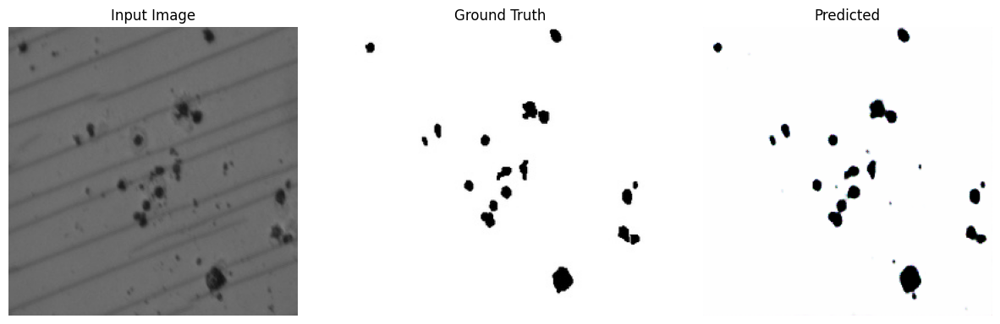


Epoch 2/100
Train G: 3.0067, D: 1.2304
 Val   G: 4.9568, D: 1.7504
✅ Saved new best model


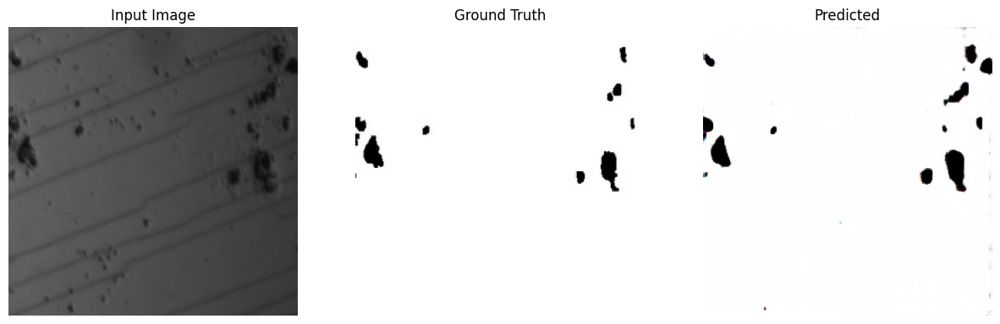


Epoch 3/100
Train G: 2.8623, D: 1.2043
 Val   G: 6.4613, D: 1.7567


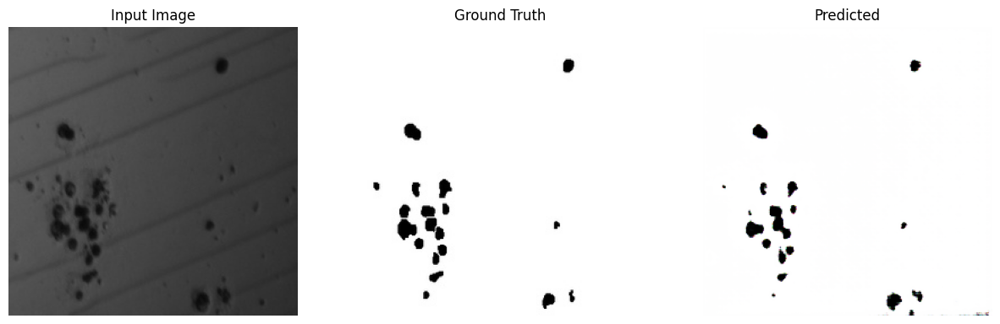


Epoch 4/100
Train G: 2.9310, D: 1.1696
 Val   G: 5.3968, D: 2.9740


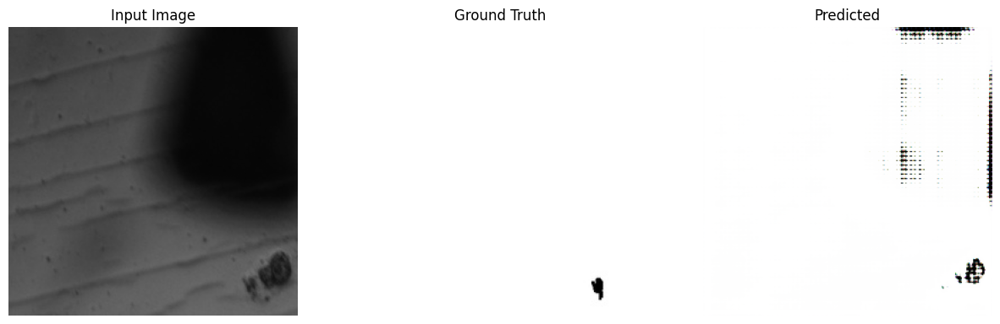


Epoch 5/100
Train G: 2.9047, D: 1.1448
 Val   G: 7.6691, D: 2.9599


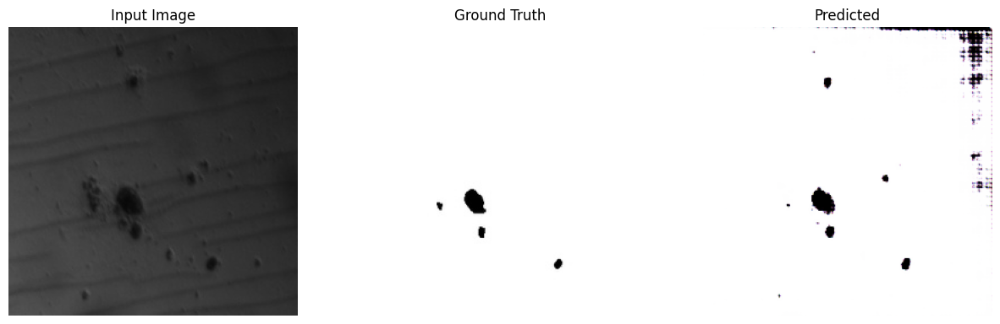


Epoch 6/100
Train G: 3.0909, D: 1.0794
 Val   G: 6.2238, D: 4.2121


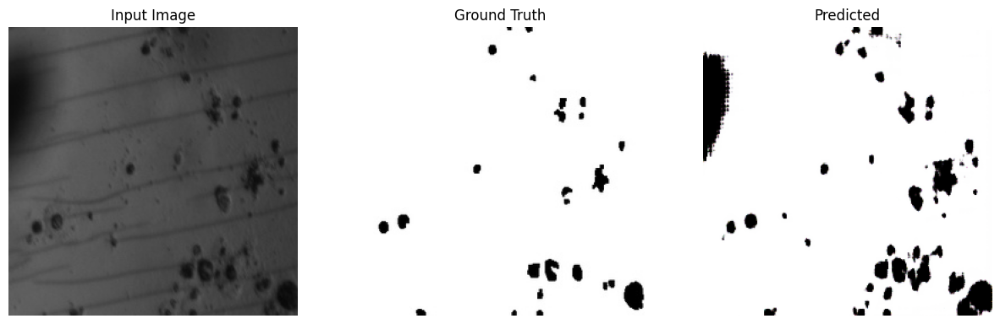


Epoch 7/100
Train G: 3.1056, D: 1.0649
 Val   G: 15.7339, D: 3.9500


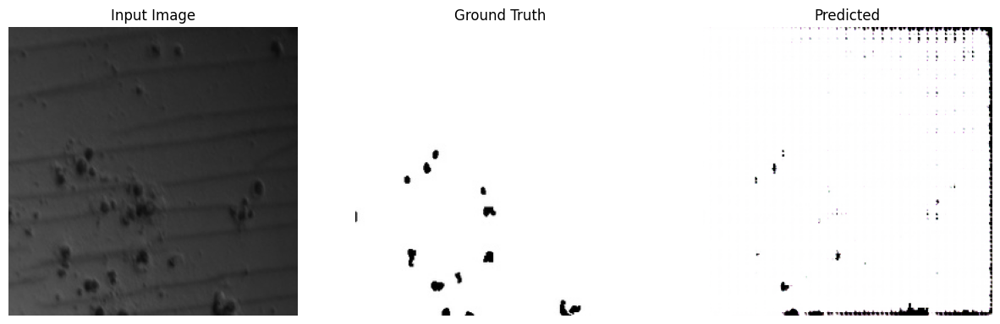


Epoch 8/100
Train G: 3.2791, D: 1.0337
 Val   G: 21.6817, D: 1.6443


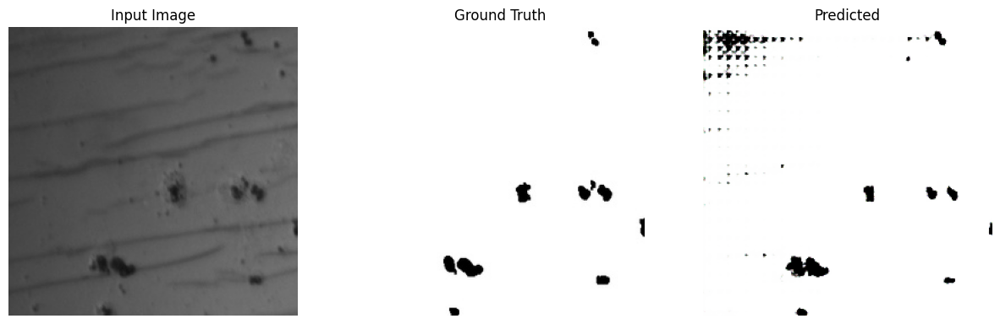


Epoch 9/100
Train G: 3.4162, D: 0.9559
 Val   G: 2.8795, D: 1.9891
✅ Saved new best model


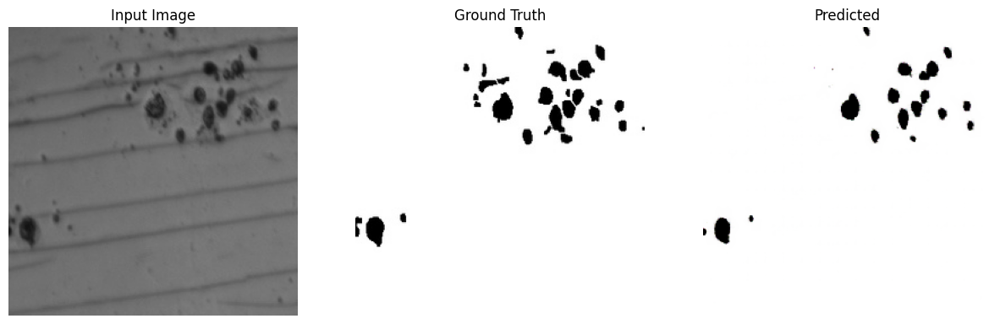


Epoch 10/100
Train G: 3.4440, D: 0.9552
 Val   G: 3.8812, D: 1.7430


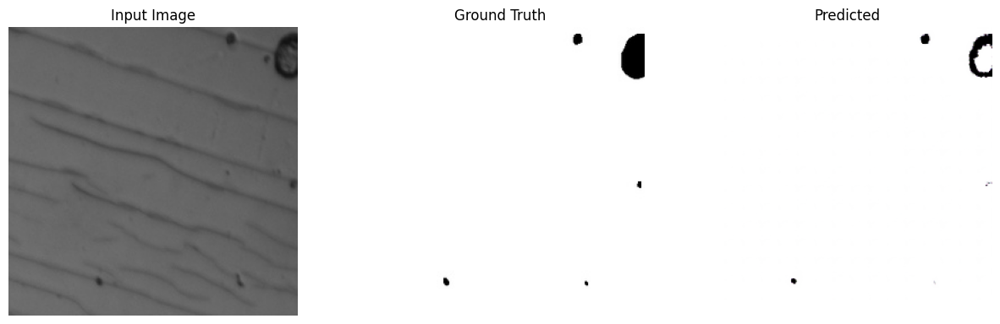


Epoch 11/100
Train G: 3.4856, D: 0.9180
 Val   G: 5.3535, D: 3.8384


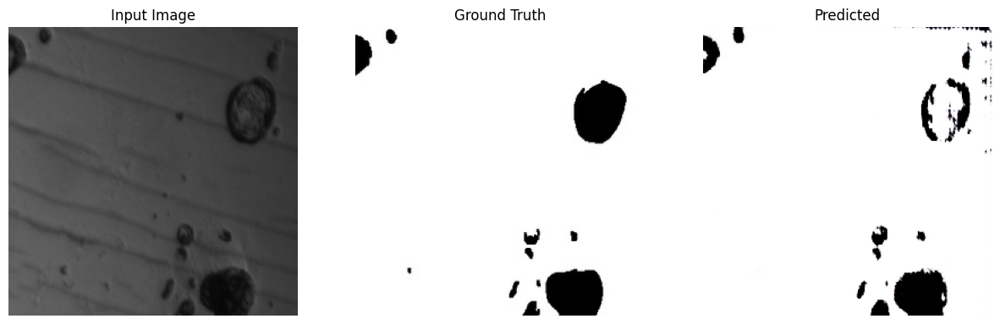


Epoch 12/100
Train G: 3.6591, D: 0.8640
 Val   G: 3.0876, D: 1.8992


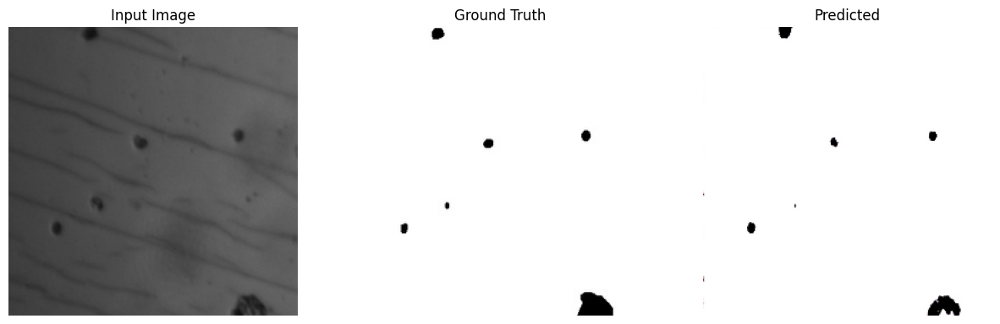


Epoch 13/100
Train G: 3.7004, D: 0.8512
 Val   G: 6.0078, D: 4.3082


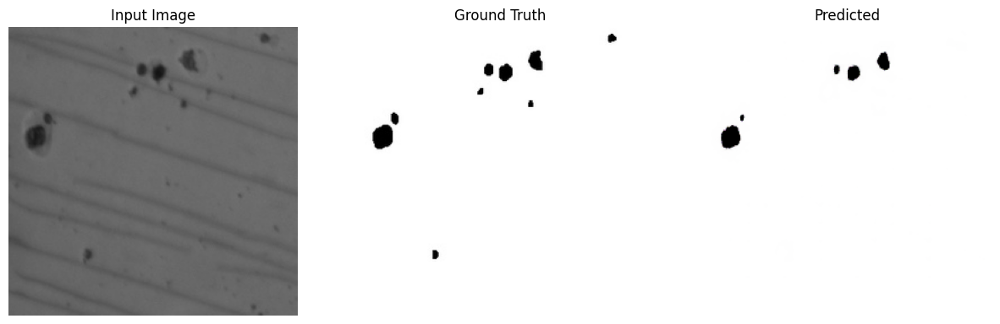


Epoch 14/100
Train G: 3.8906, D: 0.7780
 Val   G: 45.8782, D: 4.1086


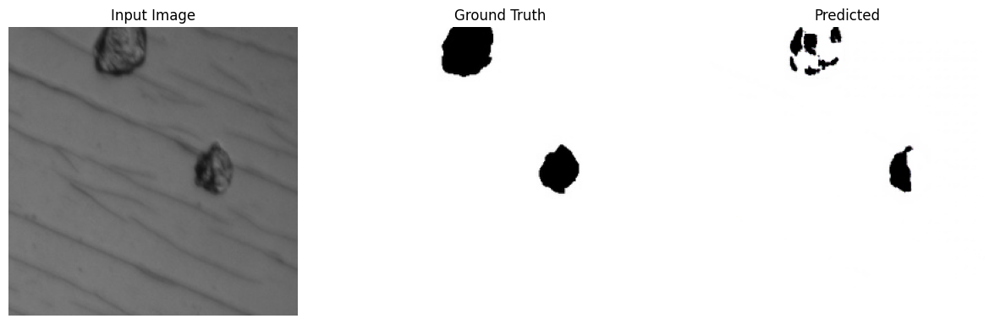


Epoch 15/100
Train G: 3.8188, D: 0.7760
 Val   G: 34.4868, D: 5.2186


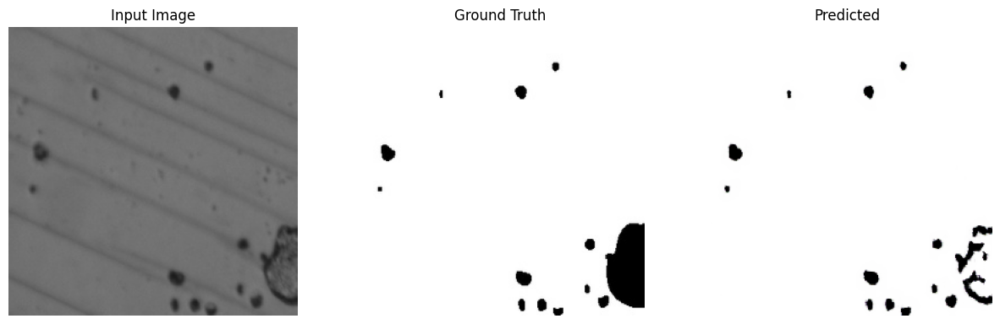


Epoch 16/100
Train G: 3.9159, D: 0.7715
 Val   G: 56.8978, D: 11.9961


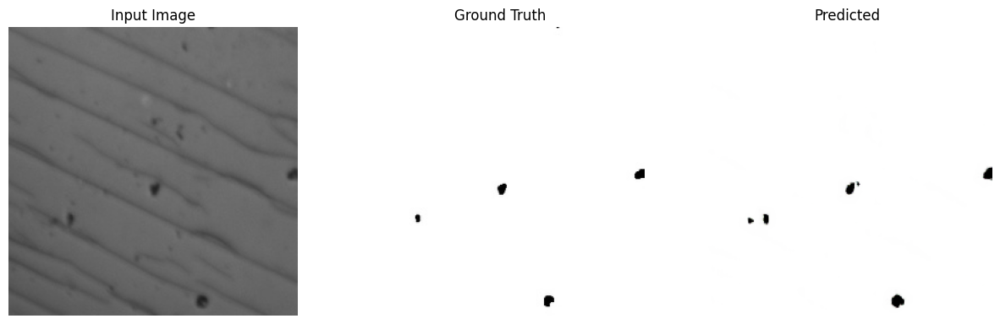


Epoch 17/100
Train G: 4.0387, D: 0.7425
 Val   G: 6.7608, D: 1.8120


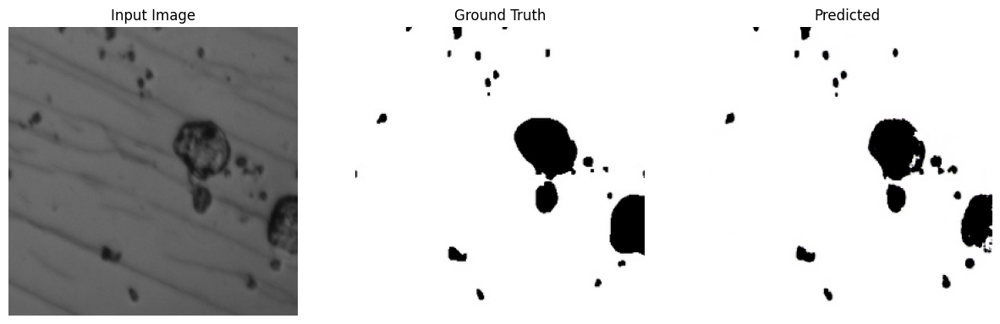


Epoch 18/100
Train G: 4.1233, D: 0.7103
 Val   G: 5.4255, D: 2.8301


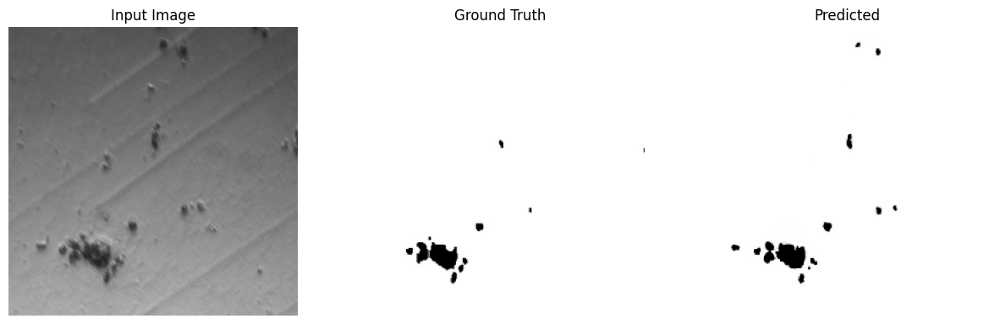


Epoch 19/100
Train G: 4.6124, D: 0.6841
 Val   G: 4.0930, D: 1.7432


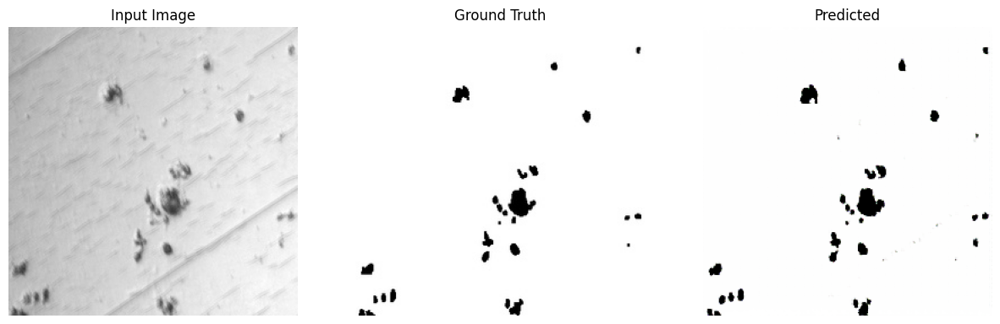


Epoch 20/100
Train G: 4.1918, D: 0.7175
 Val   G: 5.2715, D: 2.3361


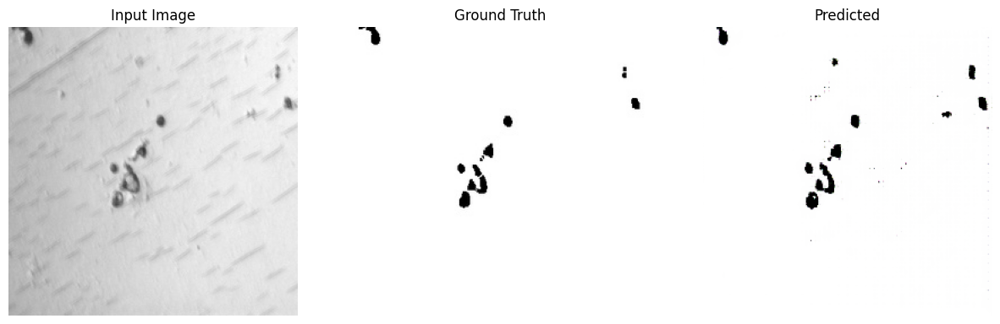


Epoch 21/100
Train G: 4.2214, D: 0.6537
 Val   G: 4.8000, D: 3.4277


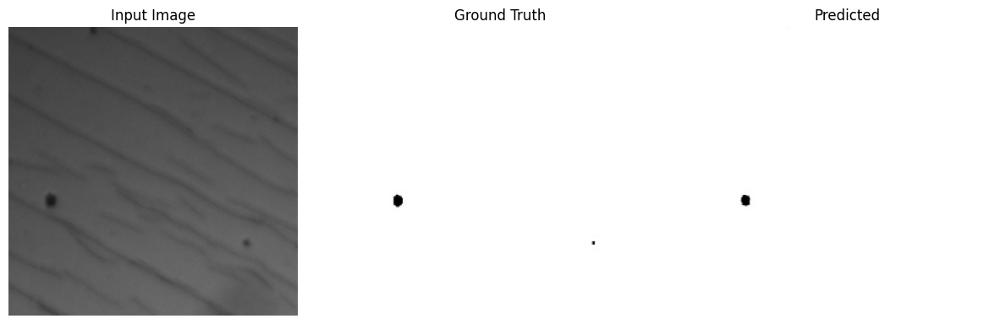


Epoch 22/100
Train G: 4.4188, D: 0.6566
 Val   G: 4.1160, D: 1.7294


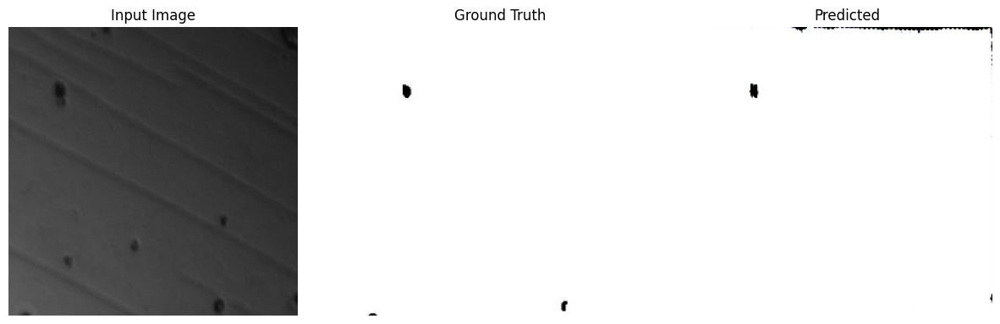


Epoch 23/100
Train G: 4.2274, D: 0.6471
 Val   G: 16.1486, D: 9.2978


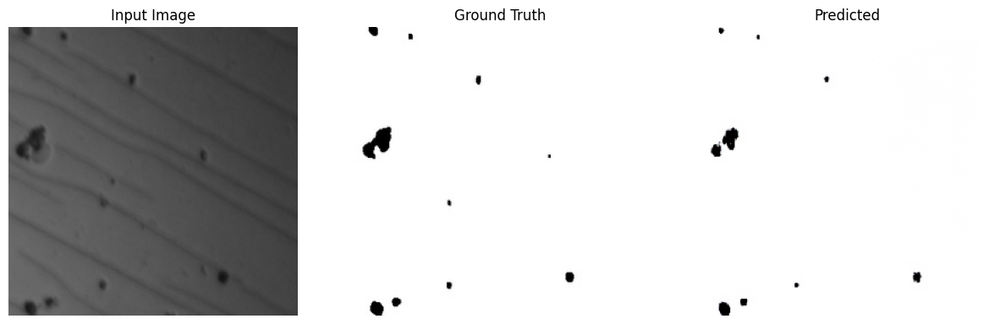


Epoch 24/100
Train G: 4.4263, D: 0.6082
 Val   G: 7.6659, D: 5.4468


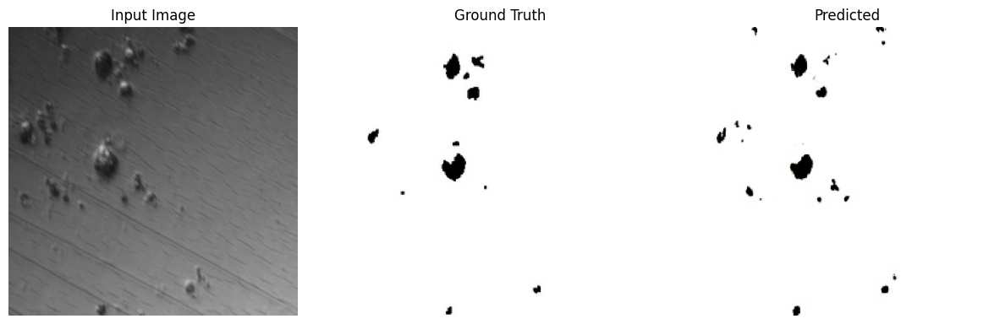


Epoch 25/100
Train G: 4.5419, D: 0.6097
 Val   G: 5.6190, D: 2.9296


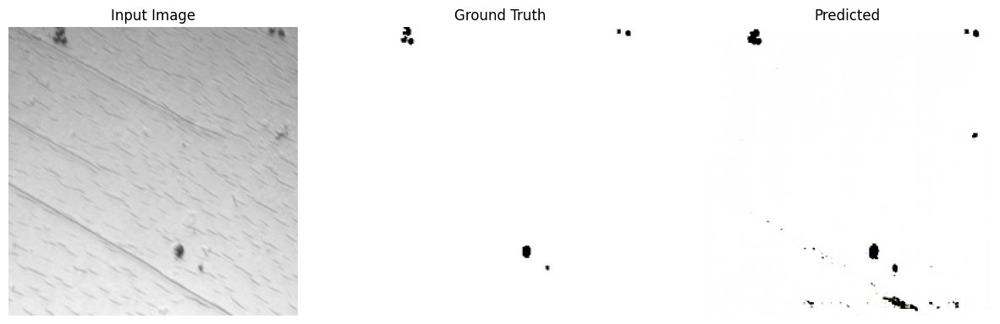


Epoch 26/100
Train G: 4.3430, D: 0.6489
 Val   G: 7.7203, D: 3.5515


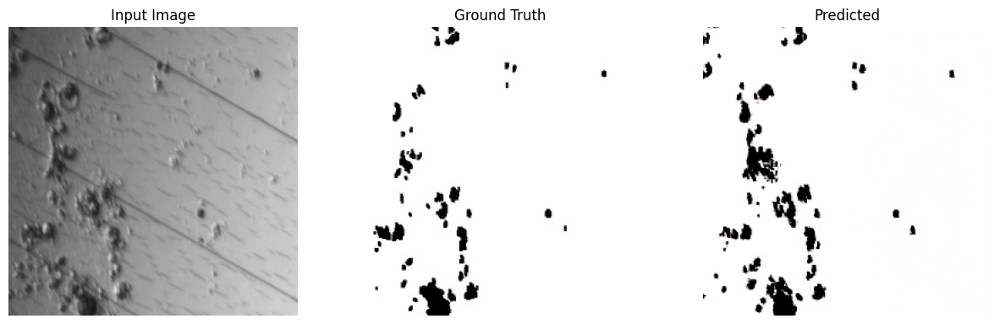


Epoch 27/100
Train G: 4.7008, D: 0.5768
 Val   G: 5.9505, D: 3.6854


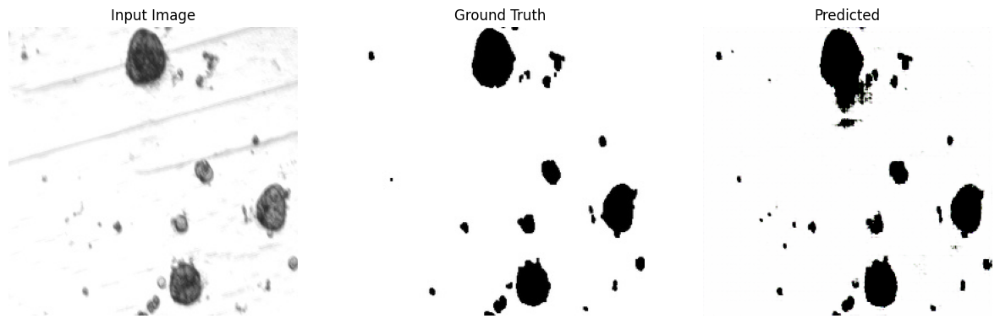


Epoch 28/100
Train G: 4.7449, D: 0.5630
 Val   G: 8.3640, D: 5.9807


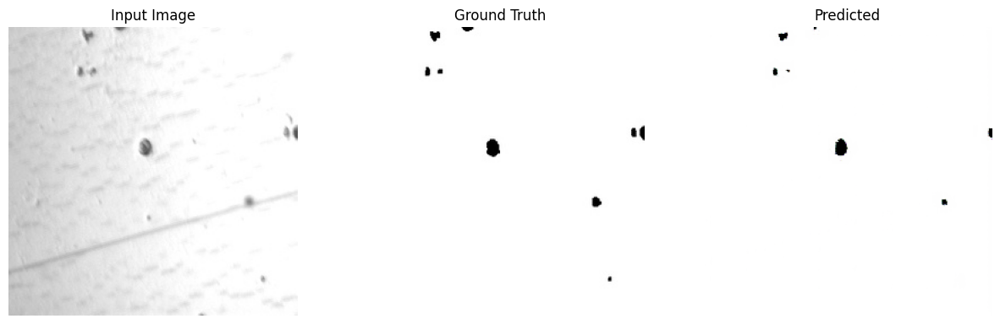


Epoch 29/100
Train G: 4.7564, D: 0.5394
 Val   G: 10.0935, D: 7.1660


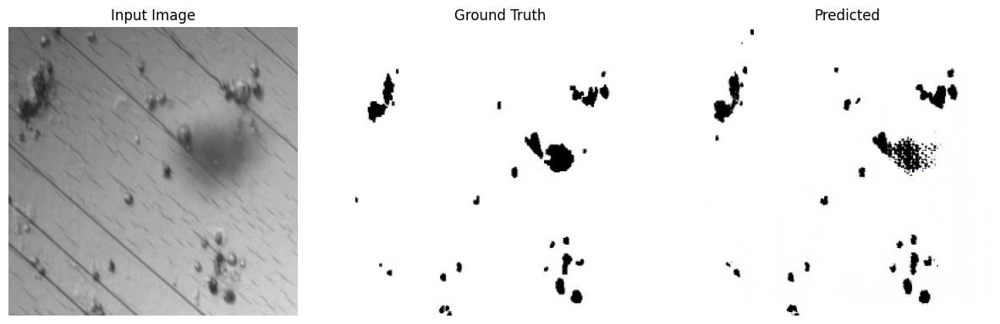


Epoch 30/100
Train G: 4.6482, D: 0.5673
 Val   G: 47.6118, D: 42.5259


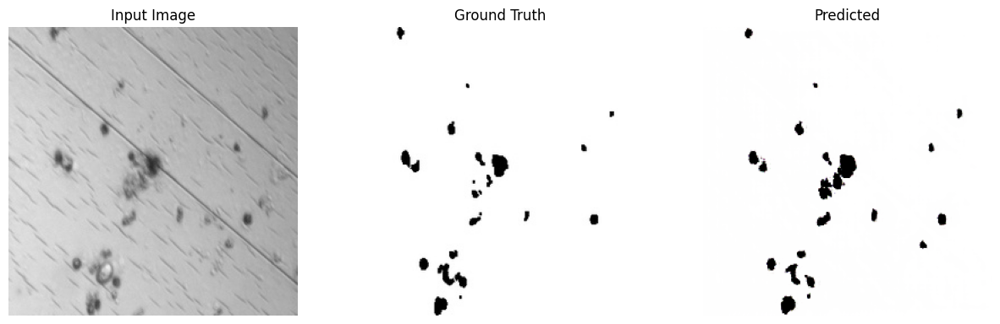


Epoch 31/100
Train G: 5.1478, D: 0.5334
 Val   G: 32.1471, D: 3.1139


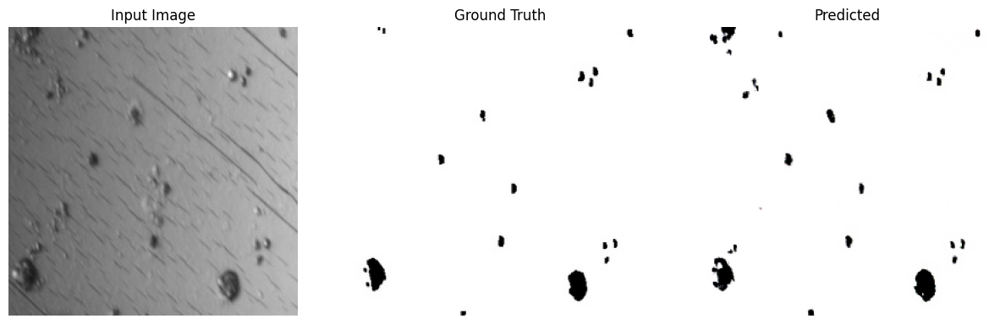


Epoch 32/100
Train G: 4.8137, D: 0.5277
 Val   G: 18.5842, D: 4.0393


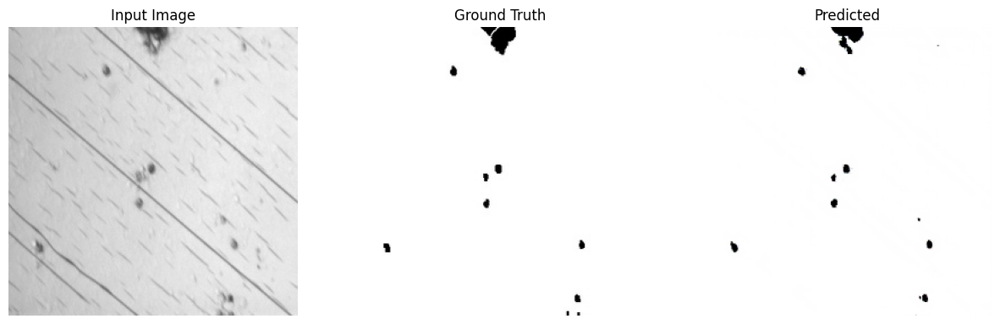


Epoch 33/100
Train G: 5.0305, D: 0.4952
 Val   G: 7.2114, D: 5.7092


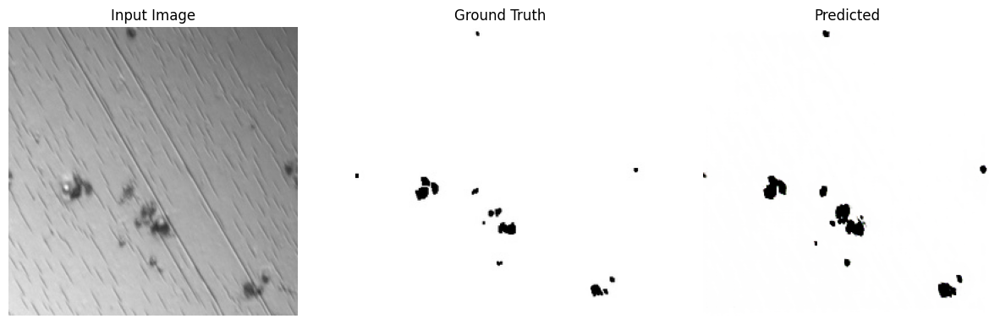


Epoch 34/100
Train G: 5.0968, D: 0.4698
 Val   G: 13.8364, D: 4.1703


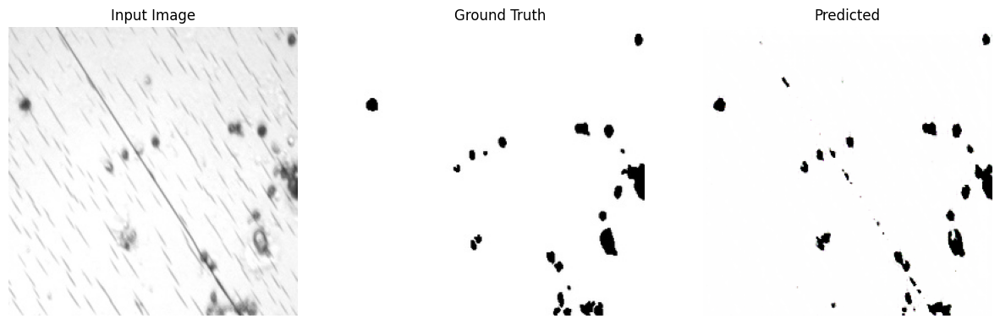


Epoch 35/100
Train G: 5.0380, D: 0.4717
 Val   G: 7.2444, D: 5.0309


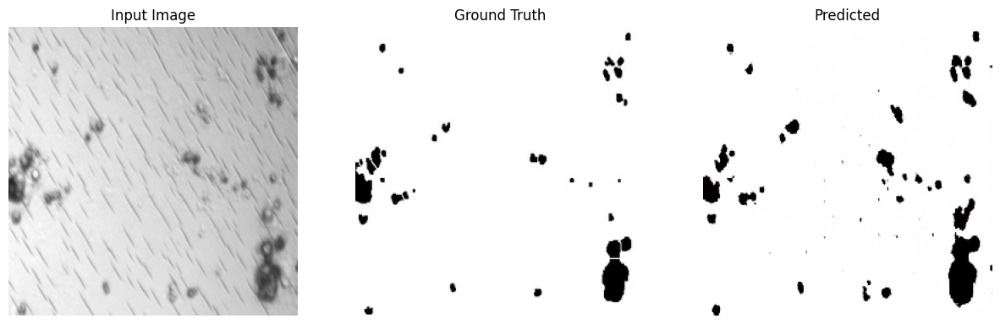


Epoch 36/100
Train G: 4.9080, D: 0.5131
 Val   G: 13.3129, D: 4.9223


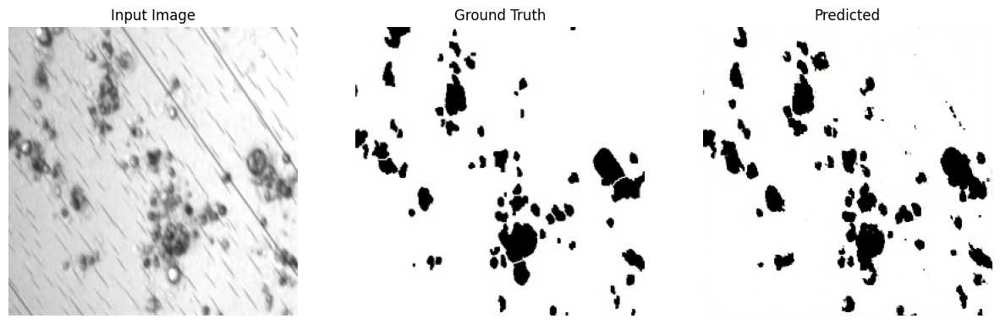


Epoch 37/100
Train G: 5.0155, D: 0.4562
 Val   G: 9.9428, D: 6.8904


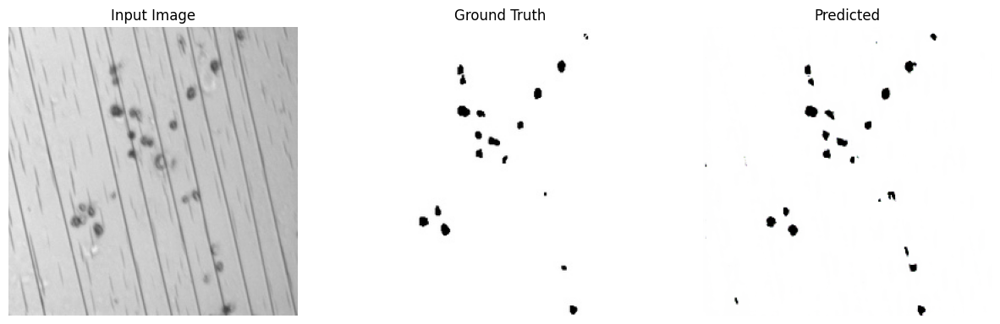


Epoch 38/100
Train G: 5.0710, D: 0.5259
 Val   G: 10.0713, D: 5.2185


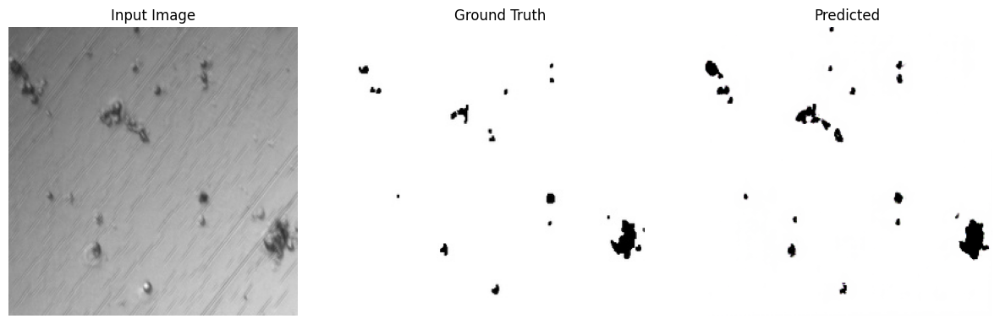


Epoch 39/100
Train G: 5.4876, D: 0.4367
 Val   G: 12.6887, D: 6.9076


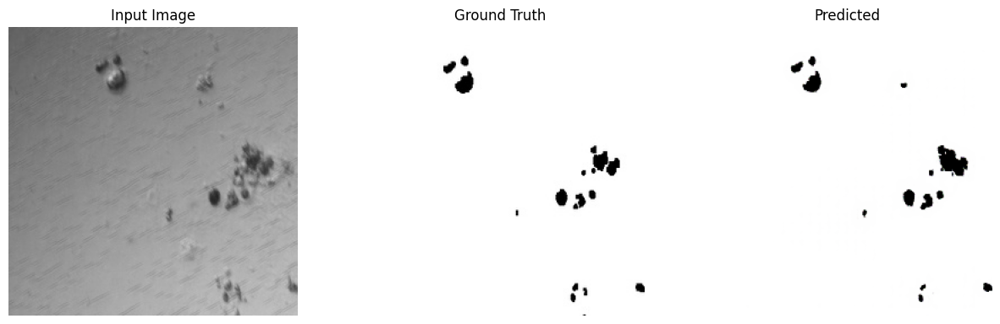


Epoch 40/100
Train G: 5.1677, D: 0.4719
 Val   G: 6.1697, D: 3.3937


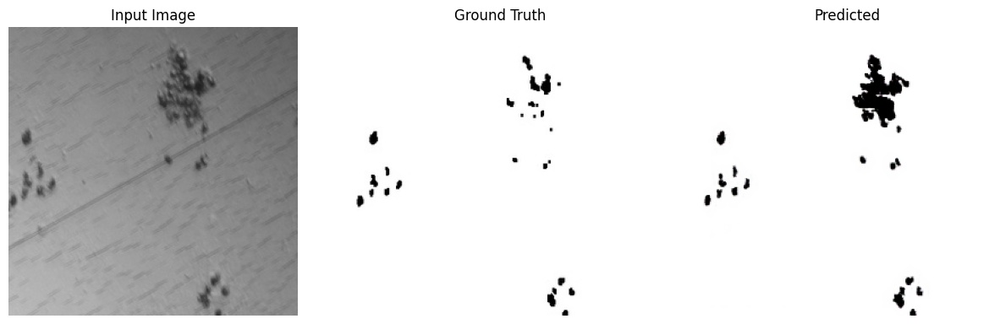


Epoch 41/100
Train G: 5.2668, D: 0.4451
 Val   G: 6.1747, D: 3.6025


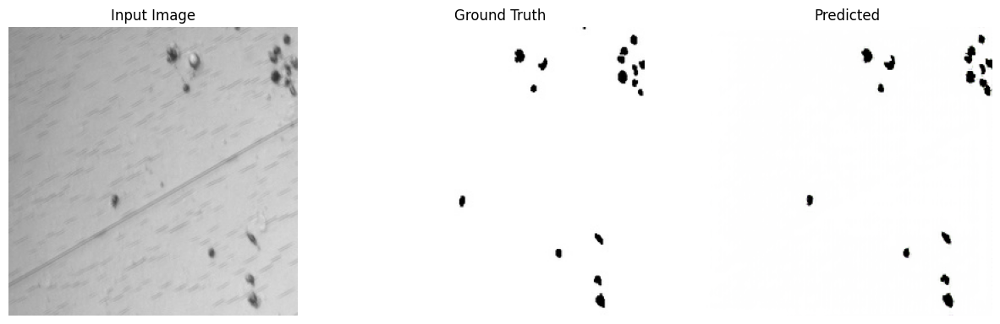


Epoch 42/100
Train G: 5.4497, D: 0.4313
 Val   G: 41.8902, D: 7.6887


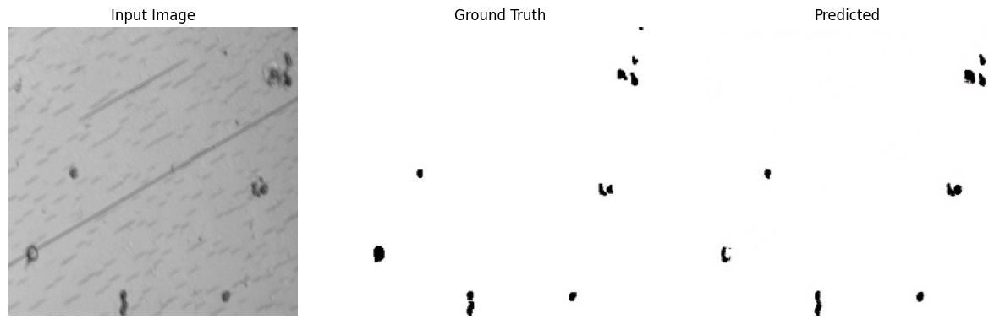


Epoch 43/100
Train G: 5.4754, D: 0.4268
 Val   G: 4.2670, D: 2.4339


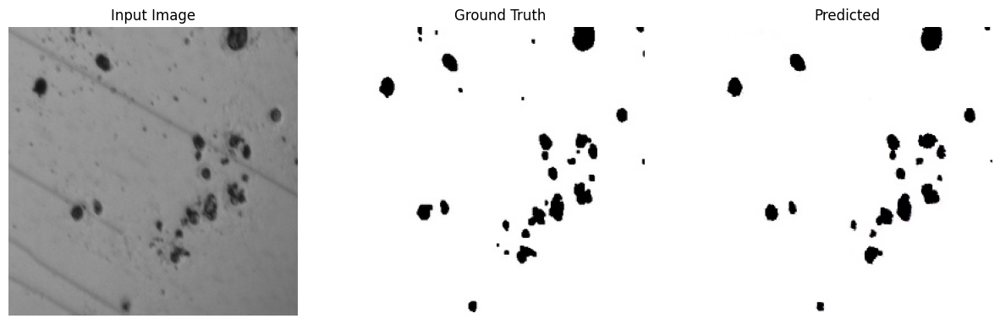


Epoch 44/100
Train G: 5.6147, D: 0.3869
 Val   G: 6.6927, D: 3.7156


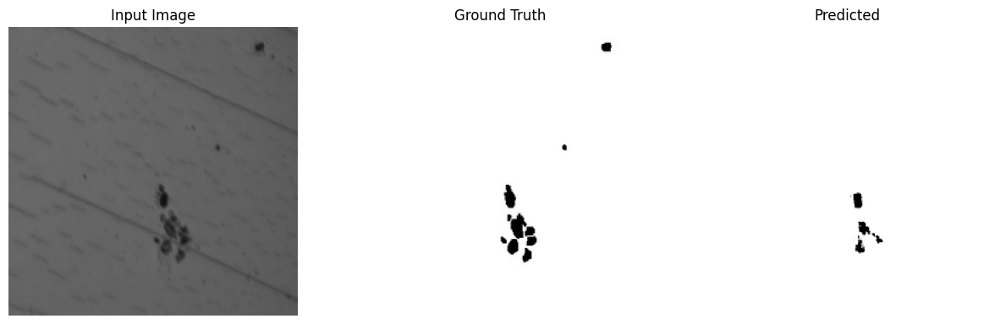


Epoch 45/100
Train G: 5.8045, D: 0.3805
 Val   G: 38.1136, D: 3.3943


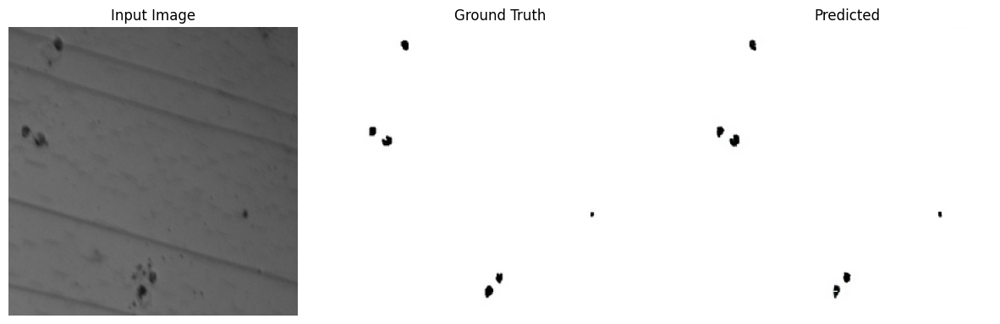


Epoch 46/100
Train G: 5.5094, D: 0.4374
 Val   G: 12.9092, D: 5.3326


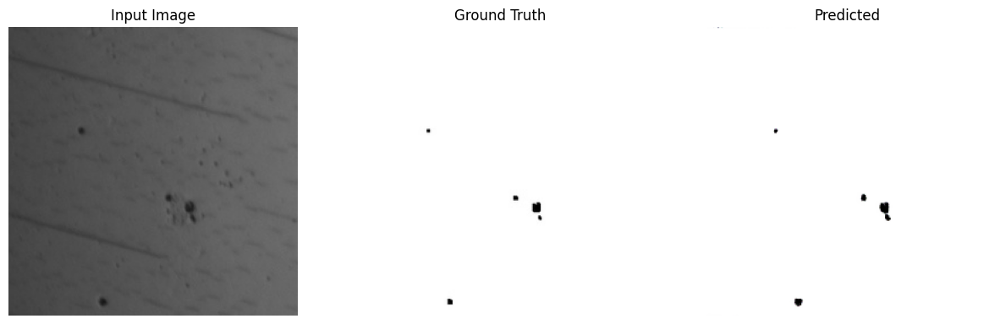


Epoch 47/100
Train G: 5.5611, D: 0.3875
 Val   G: 37.5126, D: 4.1864


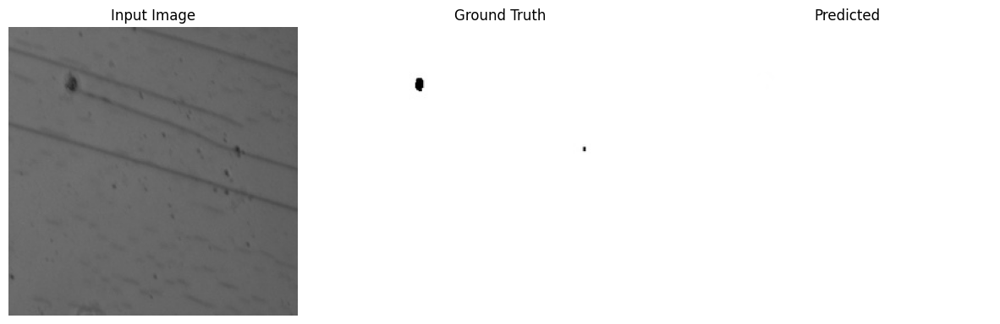


Epoch 48/100
Train G: 5.8392, D: 0.3865
 Val   G: 16.3944, D: 4.8407


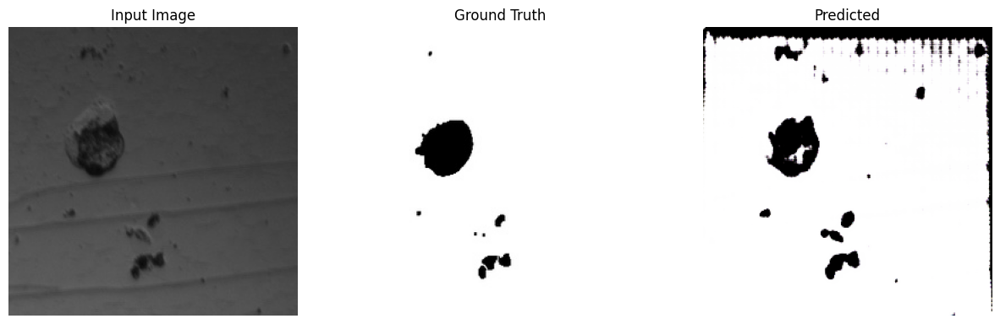


Epoch 49/100
Train G: 5.6972, D: 0.3668
 Val   G: 7.1151, D: 4.3338


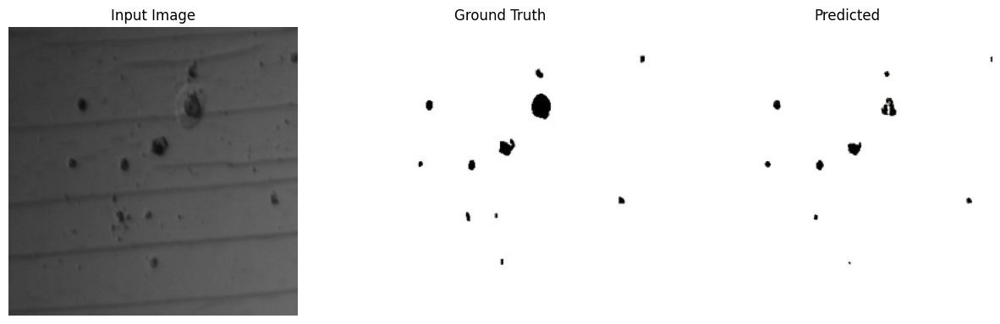


Epoch 50/100
Train G: 5.7018, D: 0.4174
 Val   G: 18.1387, D: 3.3209


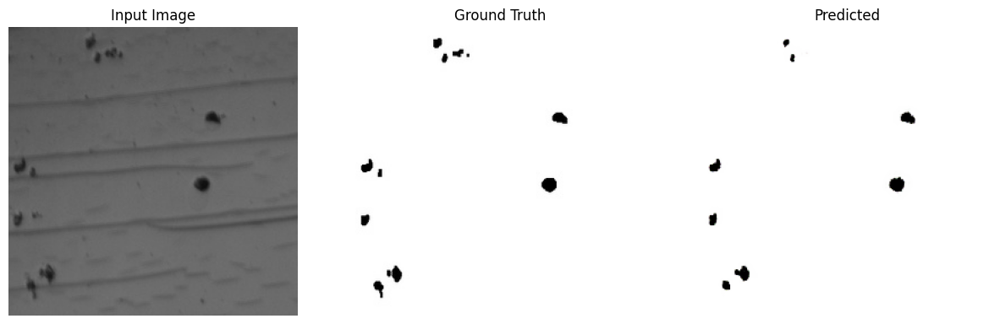


Epoch 51/100
Train G: 5.6272, D: 0.3715
 Val   G: 52.0887, D: 5.4553


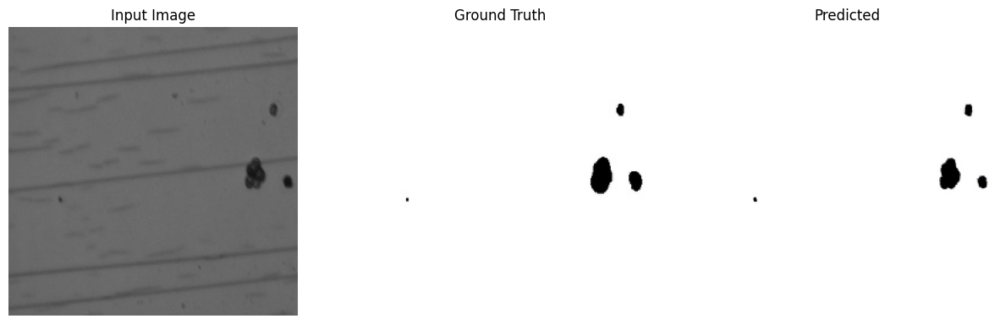


Epoch 52/100
Train G: 5.6901, D: 0.3506
 Val   G: 9.6846, D: 6.7435


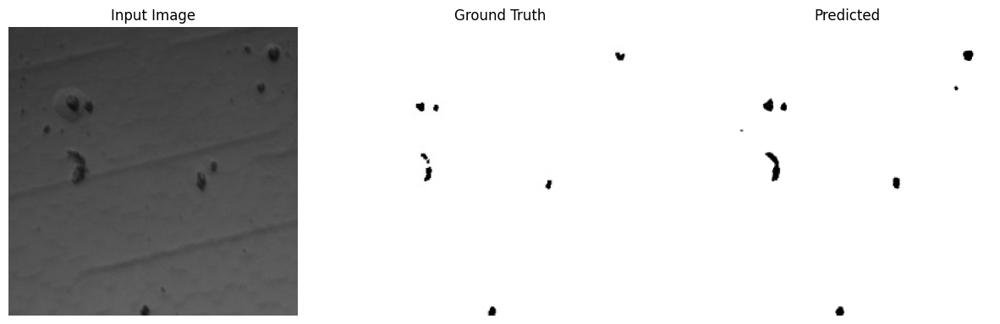


Epoch 53/100
Train G: 5.9656, D: 0.3358
 Val   G: 11.0937, D: 2.6319


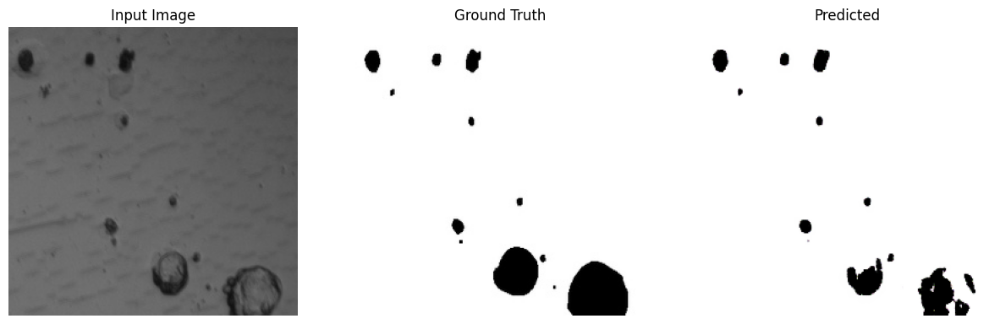


Epoch 54/100
Train G: 7.0154, D: 0.3438
 Val   G: 10.1900, D: 5.6371


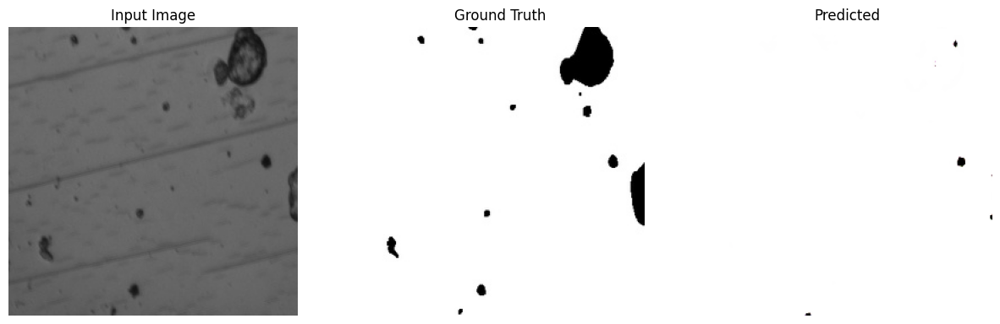


Epoch 55/100
Train G: 6.5921, D: 0.3142
 Val   G: 18.8537, D: 6.3496


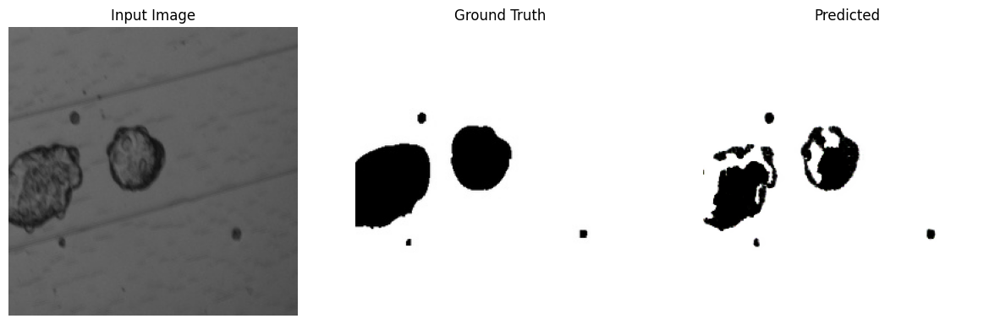


Epoch 56/100
Train G: 6.0191, D: 0.3246
 Val   G: 22.5029, D: 5.7809


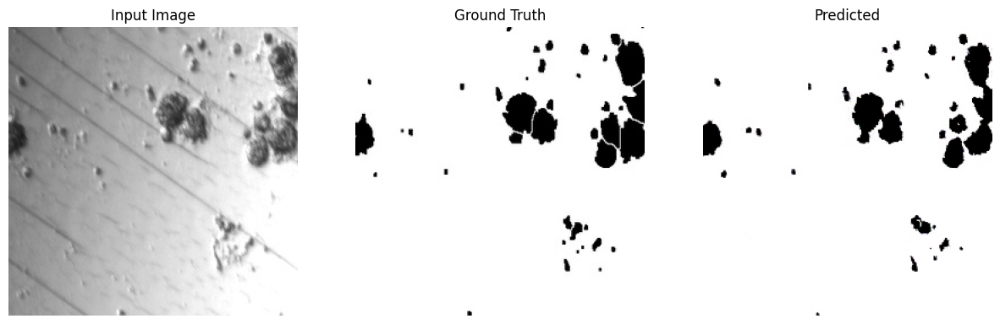


Epoch 57/100
Train G: 6.1739, D: 0.3009
 Val   G: 12.6597, D: 6.4363


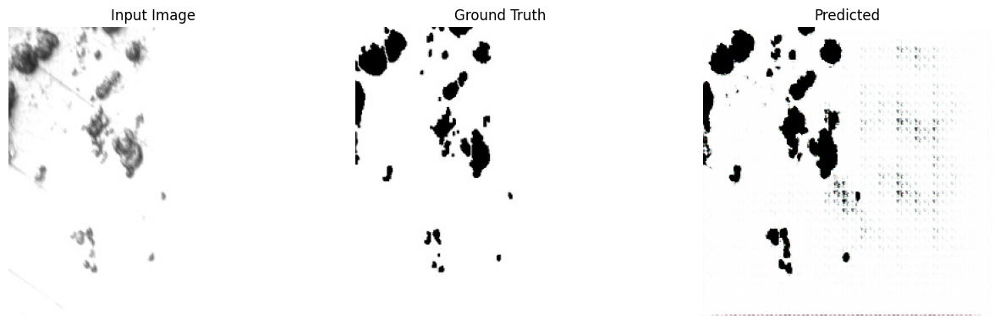


Epoch 58/100
Train G: 5.9497, D: 0.3423
 Val   G: 11.7723, D: 4.8858


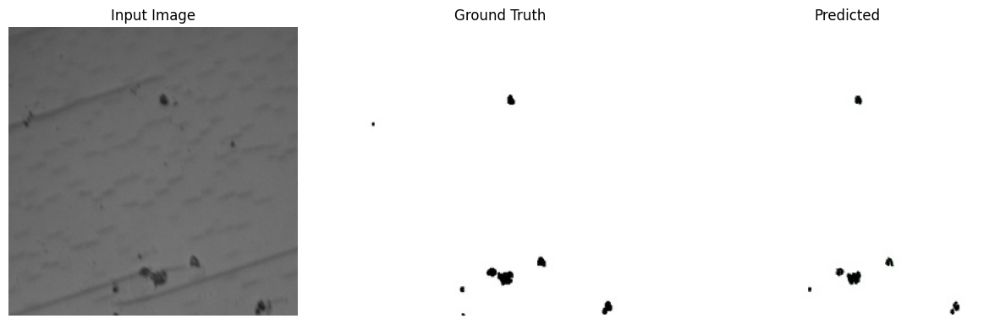


Epoch 59/100
Train G: 6.0614, D: 0.3162
 Val   G: 39.5413, D: 3.3293


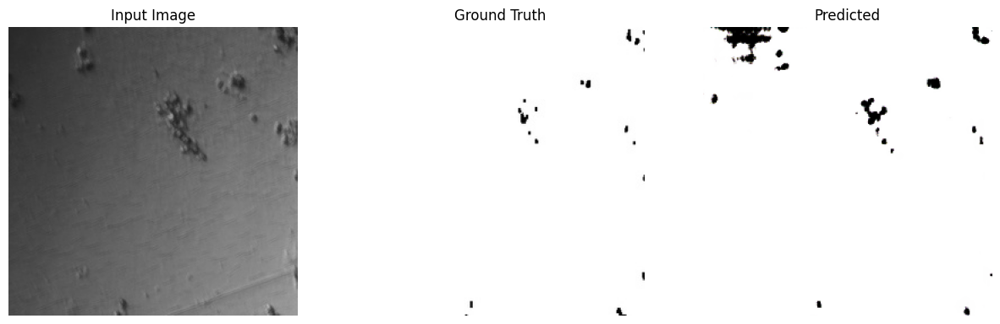


Epoch 60/100
Train G: 6.2549, D: 0.2805
 Val   G: 38.3995, D: 6.4090


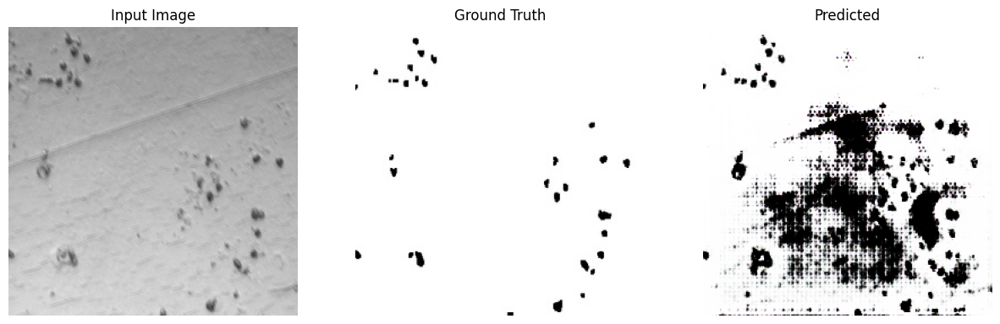


Epoch 61/100
Train G: 6.5169, D: 0.3029
 Val   G: 10.1807, D: 4.9736


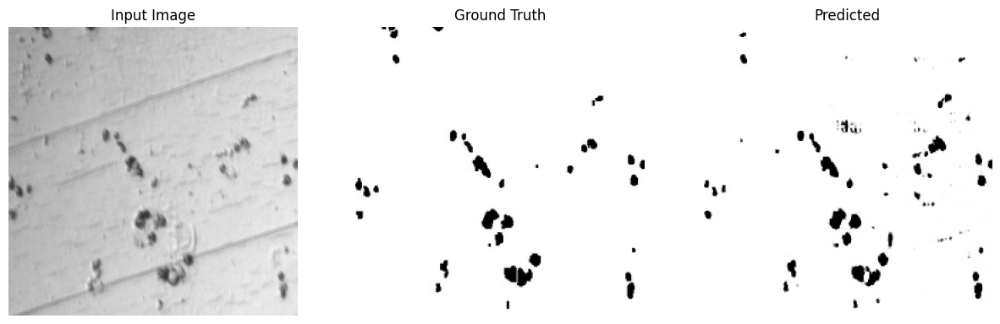


Epoch 62/100
Train G: 7.4167, D: 0.3014
 Val   G: 11.4967, D: 2.7226


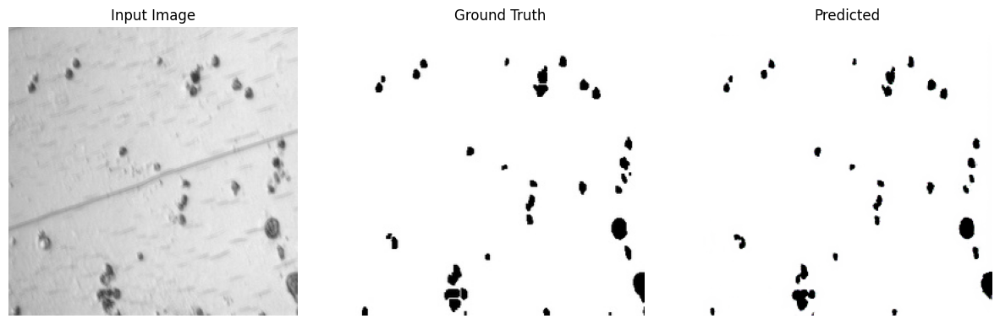


Epoch 63/100
Train G: 6.9717, D: 0.2801
 Val   G: 34.1155, D: 9.0581


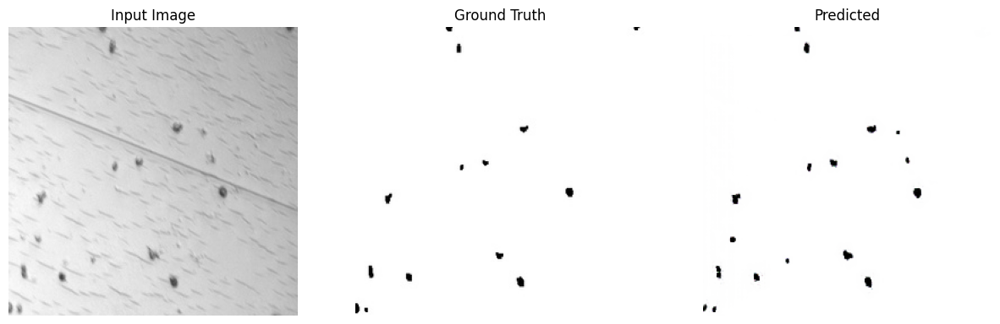


Epoch 64/100
Train G: 6.4876, D: 0.3028
 Val   G: 6.3509, D: 4.0966


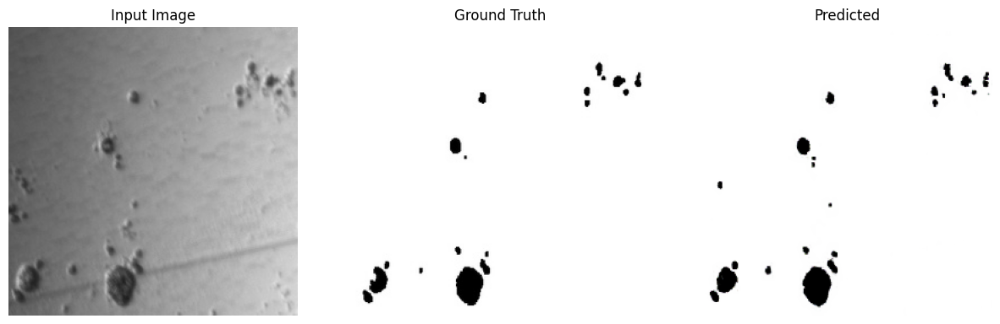


Epoch 65/100
Train G: 6.3616, D: 0.2844
 Val   G: 27.8833, D: 3.1891


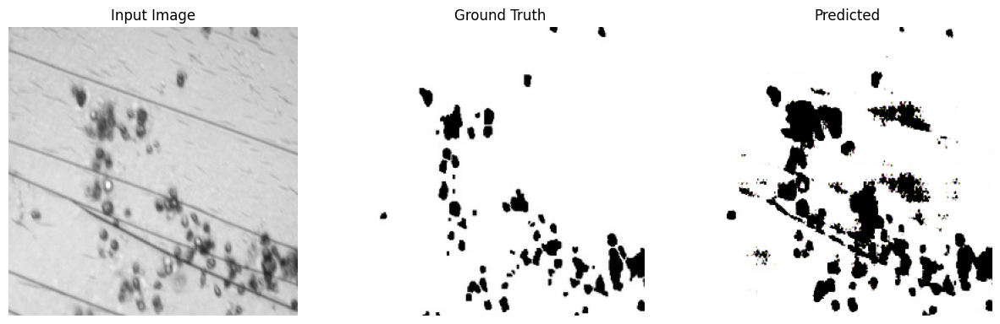


Epoch 66/100
Train G: 6.8687, D: 0.2062
 Val   G: 16.9651, D: 5.7043


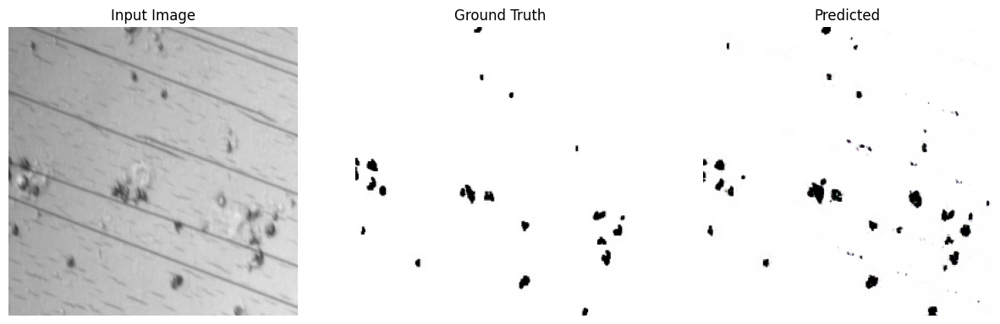


Epoch 67/100
Train G: 6.4465, D: 0.3052
 Val   G: 11.0313, D: 5.2950


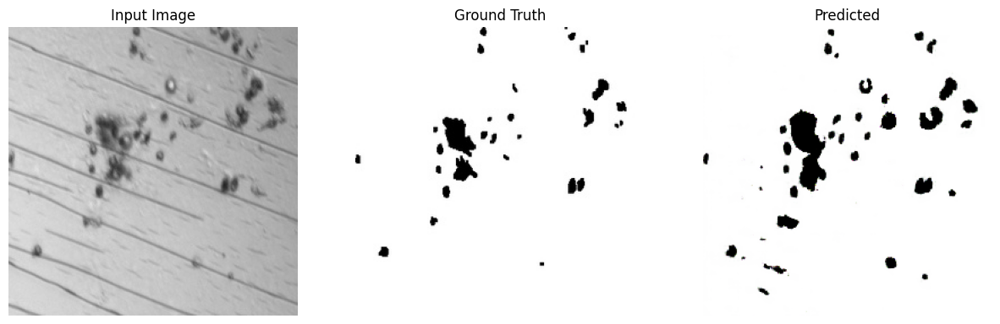


Epoch 68/100
Train G: 6.5080, D: 0.2738
 Val   G: 35.6939, D: 8.5071


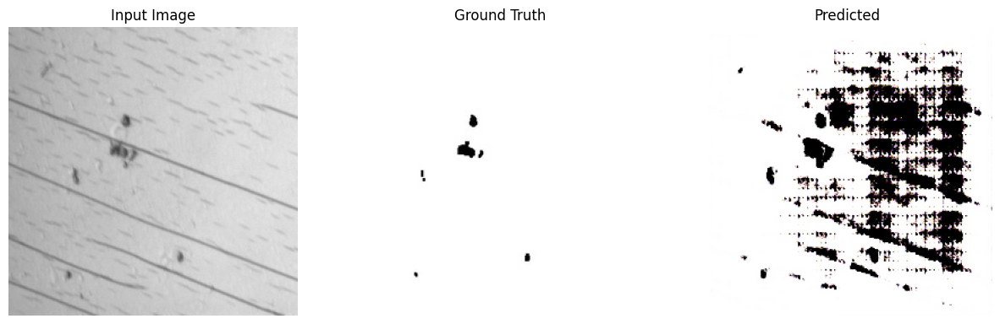


Epoch 69/100
Train G: 6.6331, D: 0.2716
 Val   G: 35.4080, D: 5.3914


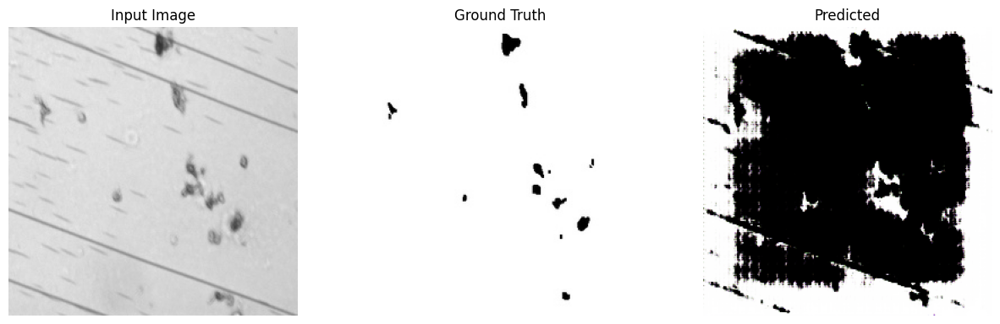


Epoch 70/100
Train G: 6.5092, D: 0.2822
 Val   G: 22.0627, D: 6.0077


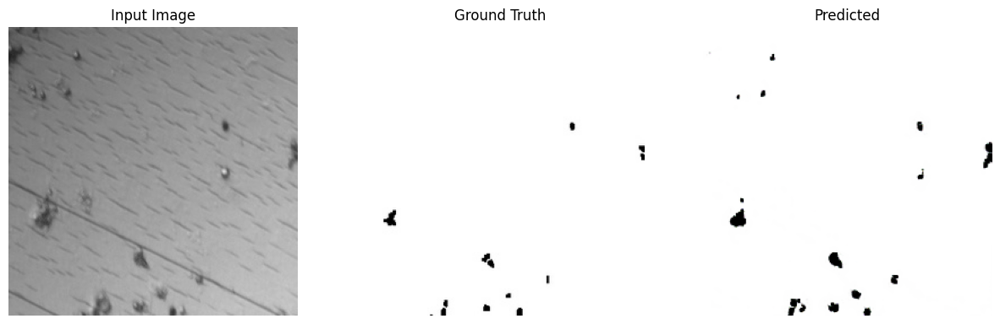


Epoch 71/100
Train G: 6.7220, D: 0.2446
 Val   G: 52.9163, D: 4.1653


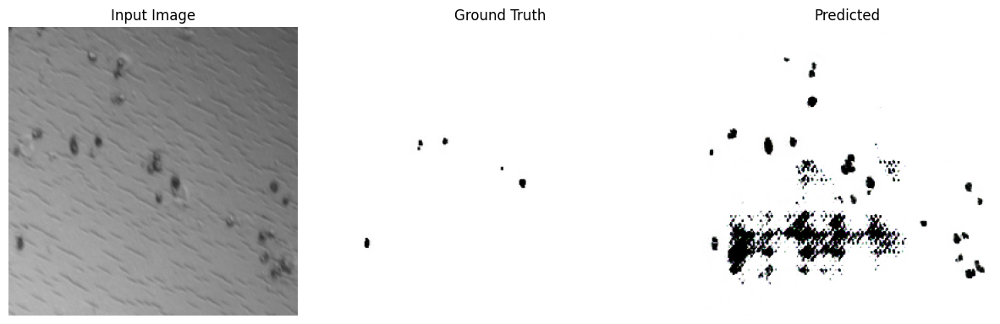


Epoch 72/100
Train G: 6.7131, D: 0.2434
 Val   G: 14.6526, D: 4.9509


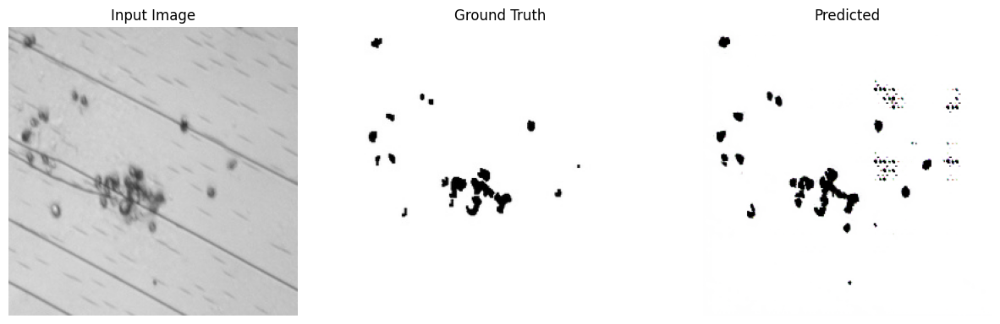


Epoch 73/100
Train G: 6.6931, D: 0.2484
 Val   G: 9.4371, D: 5.3647


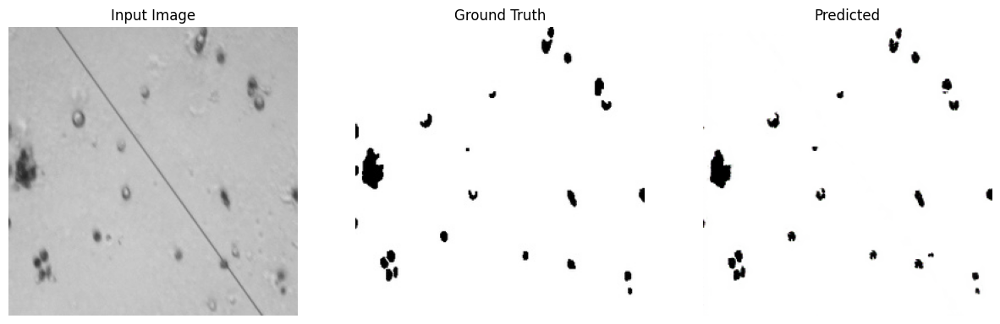


Epoch 74/100
Train G: 7.2173, D: 0.2709
 Val   G: 7.0546, D: 4.2336


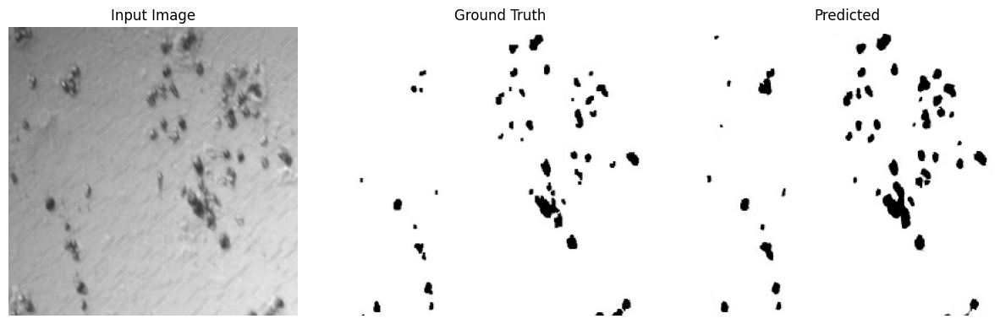


Epoch 75/100
Train G: 6.6889, D: 0.2792
 Val   G: 8.4515, D: 4.4718


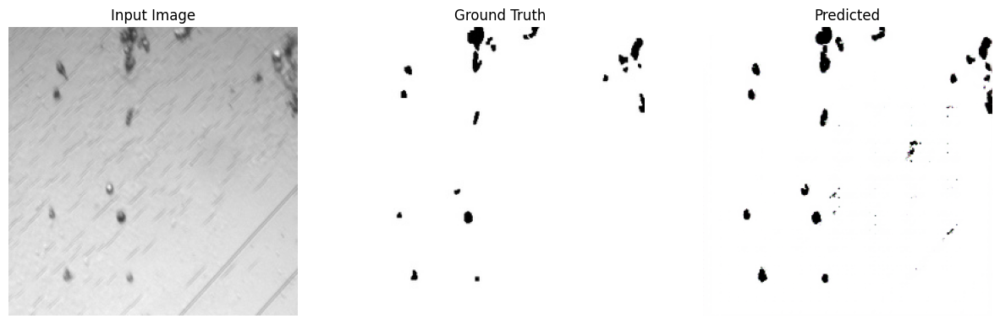


Epoch 76/100
Train G: 6.8356, D: 0.2192
 Val   G: 12.5227, D: 6.9126


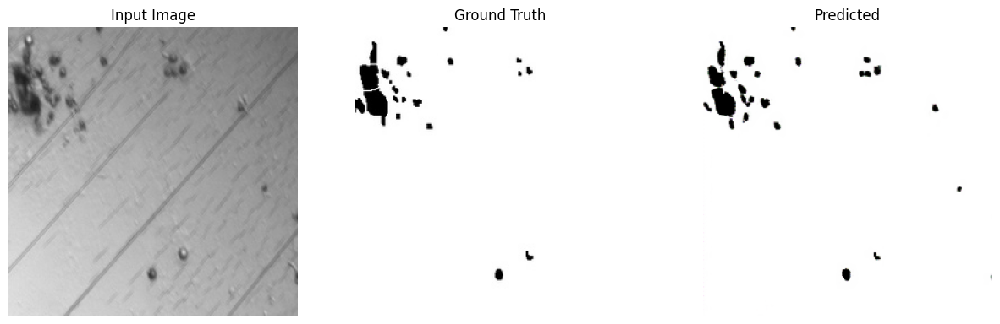


Epoch 77/100
Train G: 6.7116, D: 0.2391
 Val   G: 6.3906, D: 4.1905


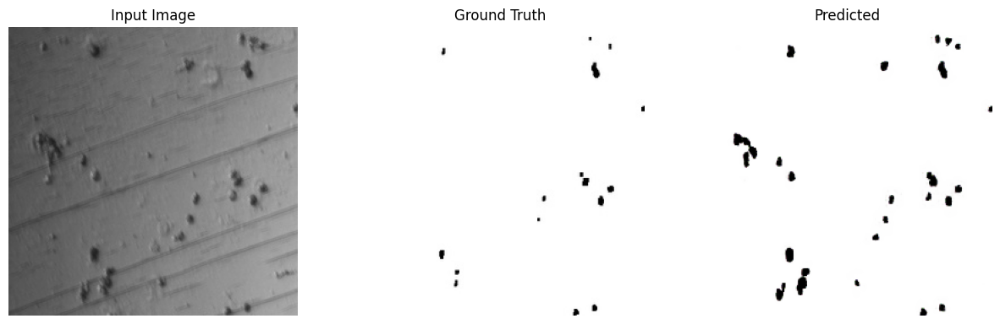


Epoch 78/100
Train G: 6.9400, D: 0.2258
 Val   G: 30.9657, D: 4.4658


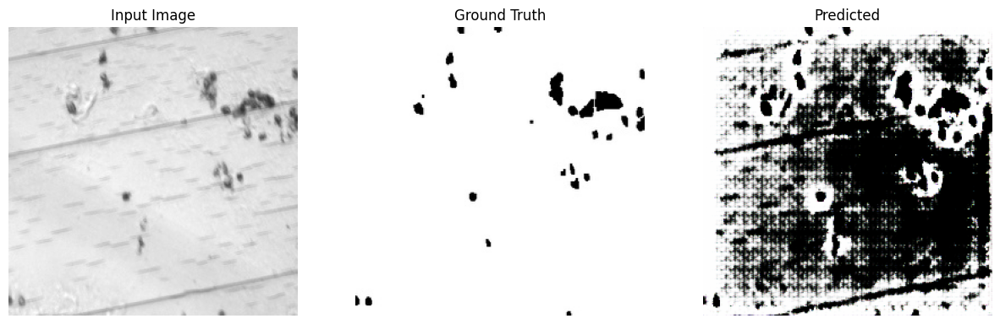


Epoch 79/100
Train G: 7.4592, D: 0.2565
 Val   G: 6.1151, D: 2.9668


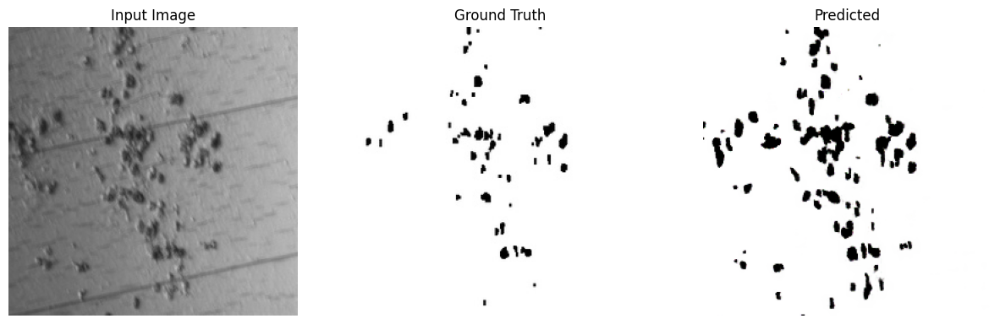


Epoch 80/100
Train G: 6.9004, D: 0.2604
 Val   G: 5.8104, D: 3.3766


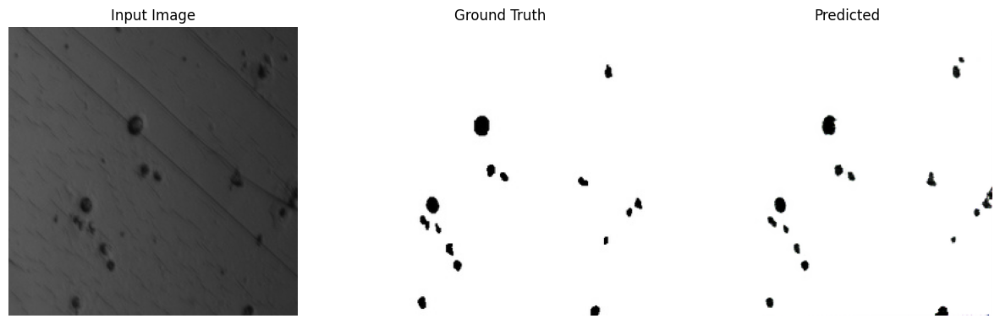


Epoch 81/100
Train G: 7.2006, D: 0.2032
 Val   G: 9.0134, D: 6.4194


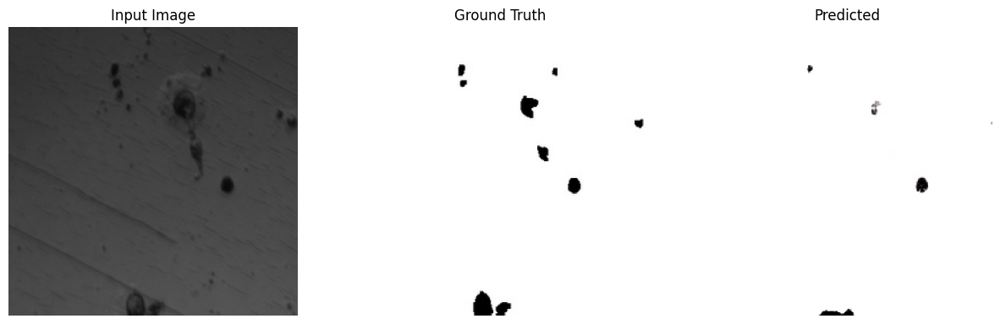


Epoch 82/100
Train G: 7.2936, D: 0.1726
 Val   G: 9.5167, D: 4.7978


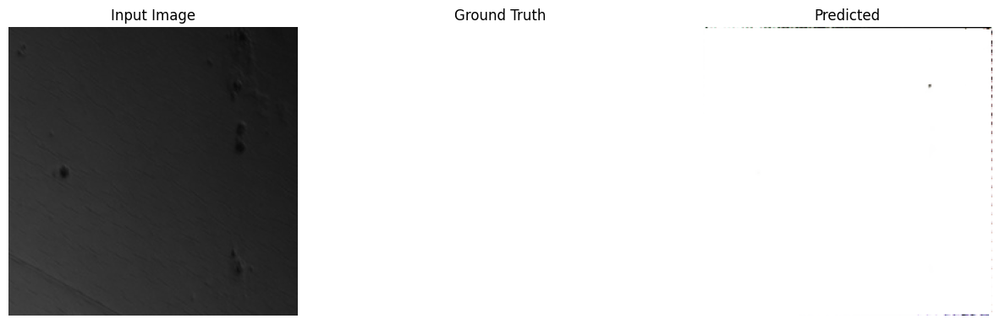


Epoch 83/100
Train G: 7.1407, D: 0.2637
 Val   G: 11.4795, D: 2.9430


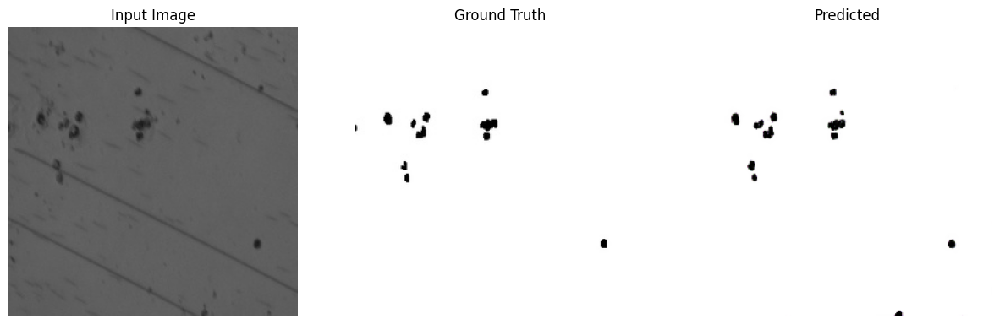


Epoch 84/100
Train G: 7.1000, D: 0.2426
 Val   G: 16.9603, D: 3.5840


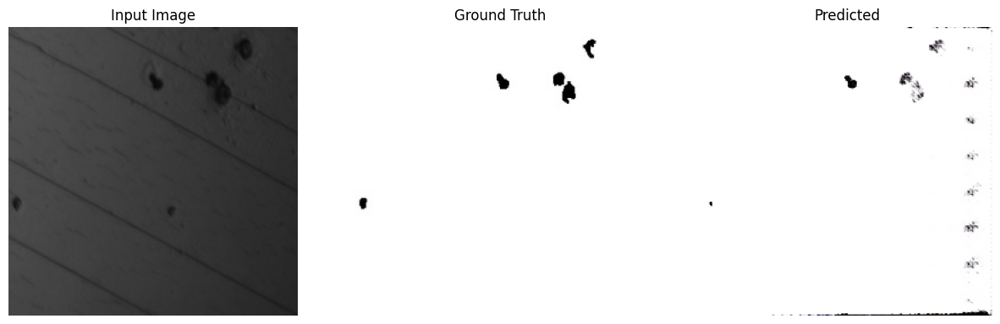


Epoch 85/100
Train G: 7.2760, D: 0.1972
 Val   G: 15.7807, D: 6.0976


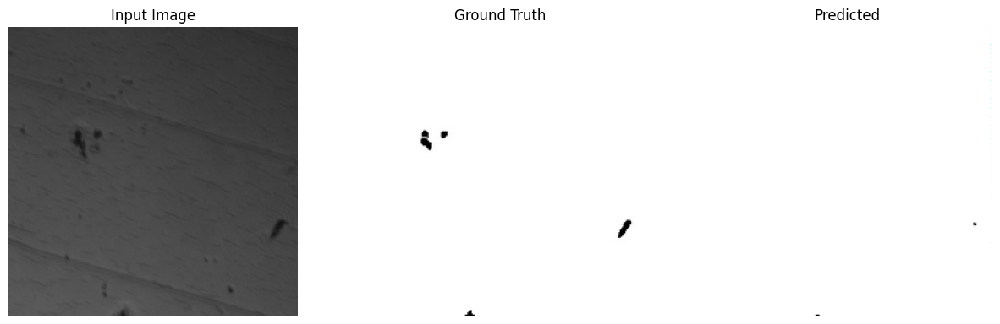


Epoch 86/100
Train G: 7.3257, D: 0.1861
 Val   G: 5.9115, D: 2.9119


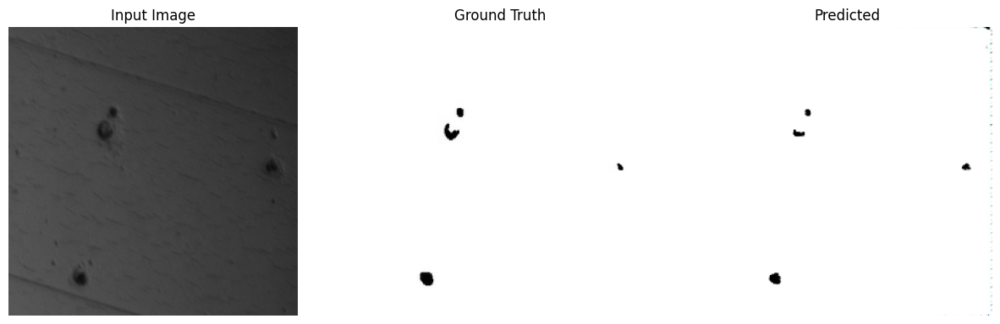


Epoch 87/100
Train G: 7.0675, D: 0.2561
 Val   G: 30.9074, D: 2.9726


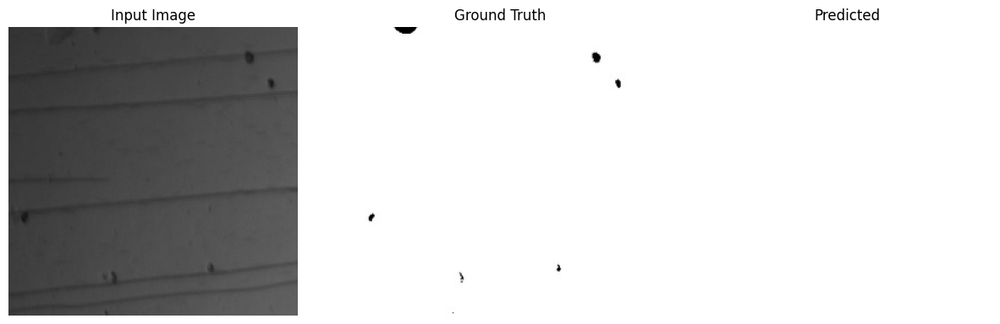


Epoch 88/100
Train G: 7.7097, D: 0.2099
 Val   G: 9.7623, D: 3.9175


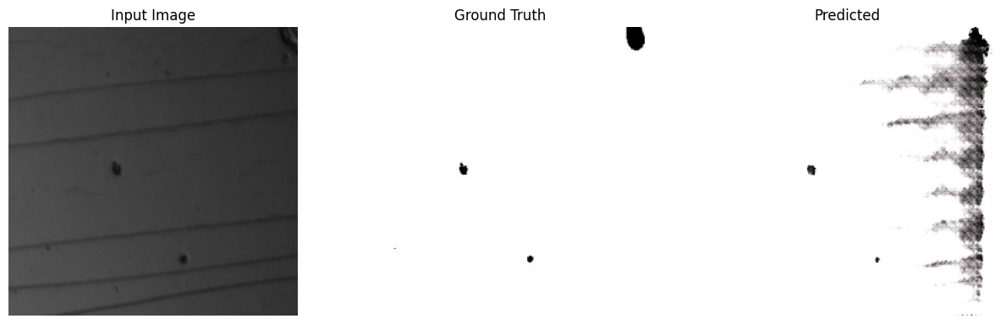


Epoch 89/100
Train G: 7.4930, D: 0.1566
 Val   G: 34.8315, D: 3.4231


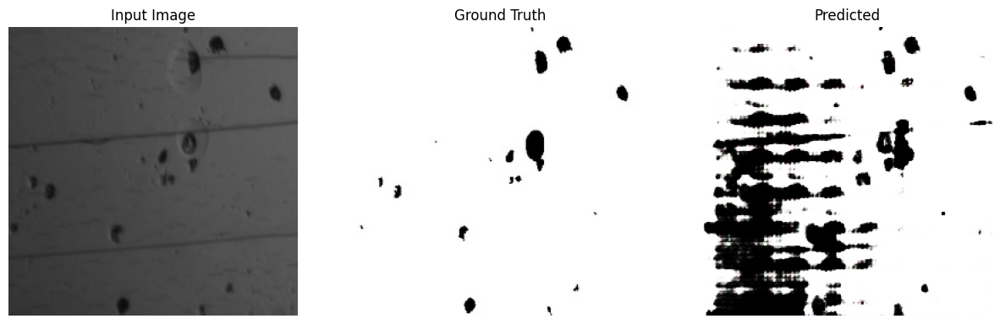


Epoch 90/100
Train G: 7.3068, D: 0.2444
 Val   G: 9.9256, D: 2.8306


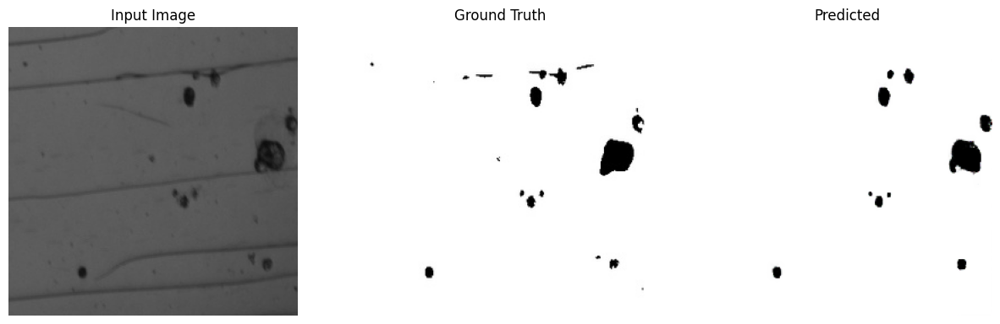


Epoch 91/100
Train G: 7.3593, D: 0.1819
 Val   G: 7.9115, D: 4.6673


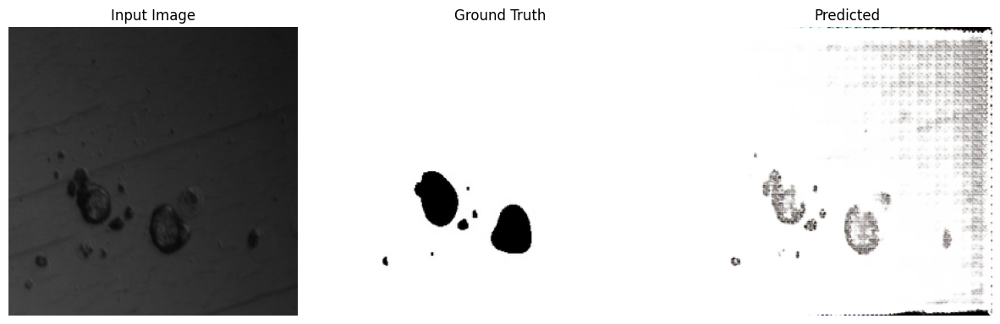


Epoch 92/100
Train G: 7.3527, D: 0.2075
 Val   G: 9.0810, D: 4.7806


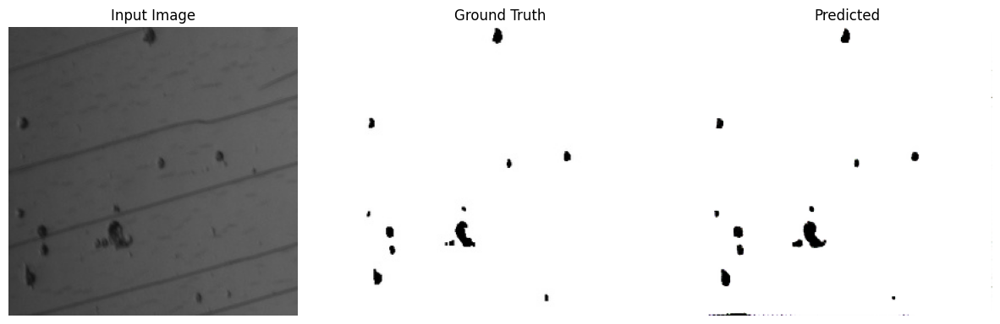


Epoch 93/100
Train G: 7.5281, D: 0.1719
 Val   G: 17.4640, D: 6.3645


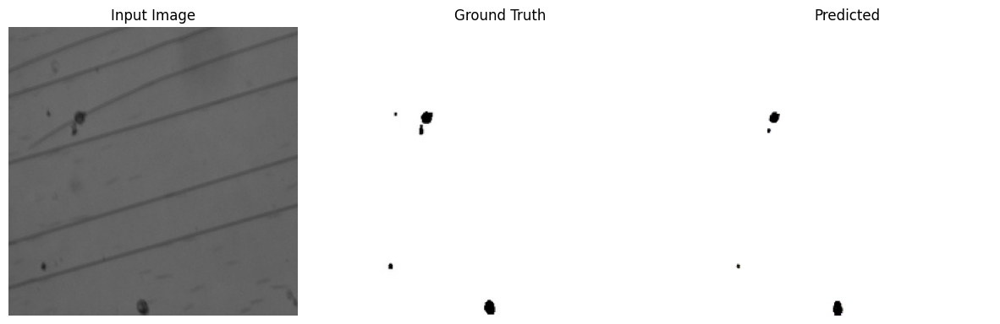


Epoch 94/100
Train G: 7.1843, D: 0.2166
 Val   G: 7.5952, D: 4.3205


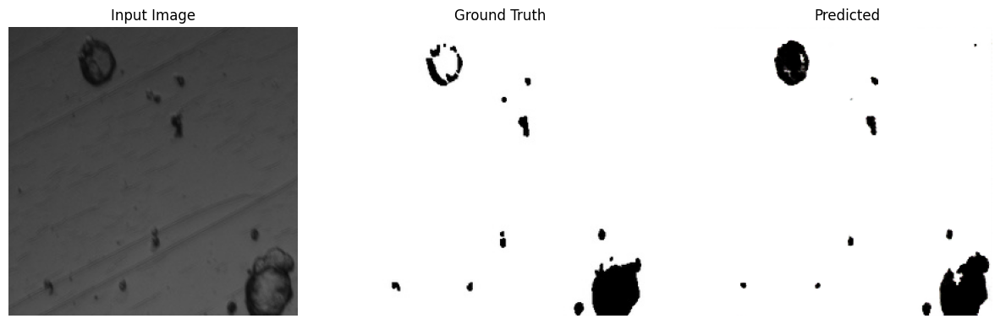


Epoch 95/100
Train G: 7.3704, D: 0.1916
 Val   G: 12.8850, D: 4.9097


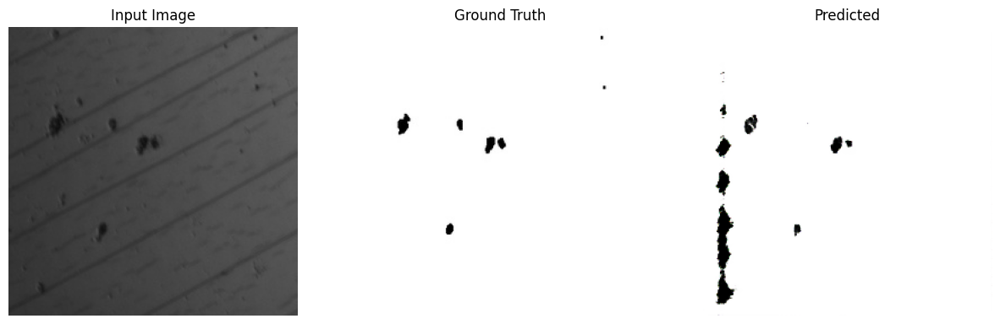


Epoch 96/100
Train G: 7.4327, D: 0.2186
 Val   G: 11.5886, D: 3.7849


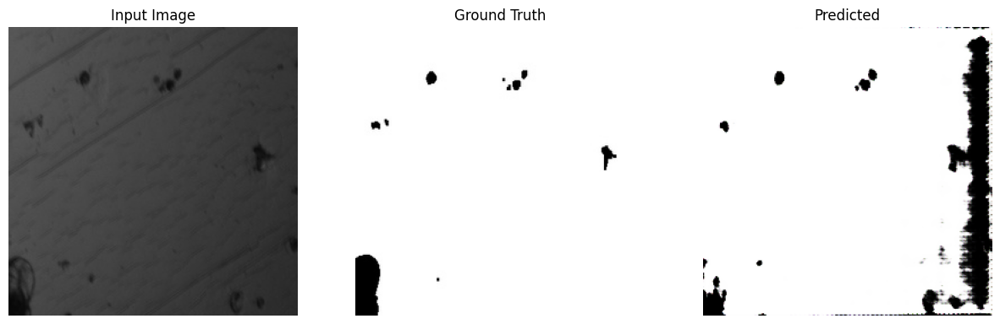


Epoch 97/100
Train G: 7.5815, D: 0.2096
 Val   G: 63.3182, D: 2.7651


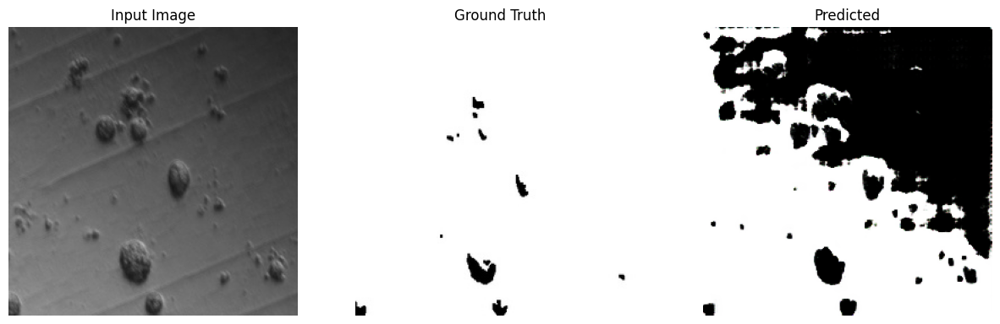


Epoch 98/100
Train G: 7.7418, D: 0.1643
 Val   G: 6.9763, D: 3.5615


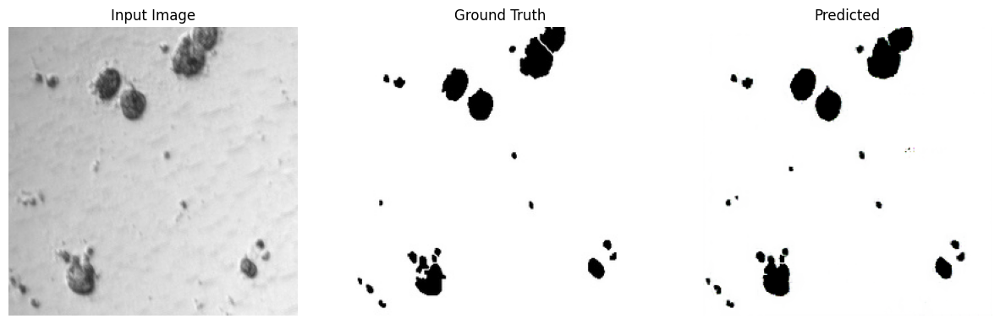


Epoch 99/100
Train G: 7.5663, D: 0.1998
 Val   G: 23.6340, D: 2.9282


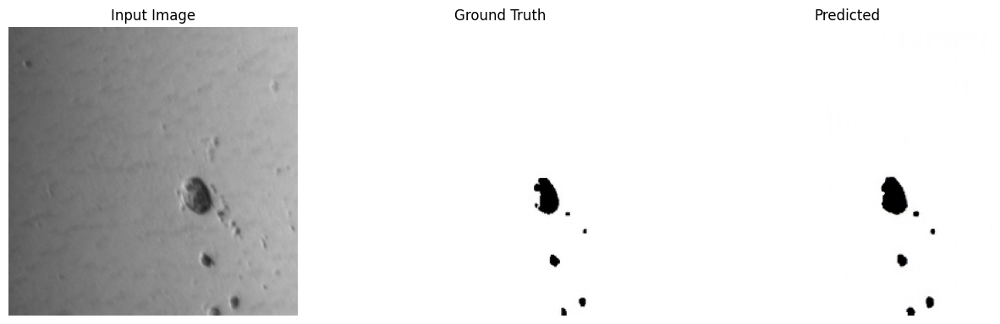


Epoch 100/100
Train G: 7.5174, D: 0.1815
 Val   G: 9.0286, D: 3.2739


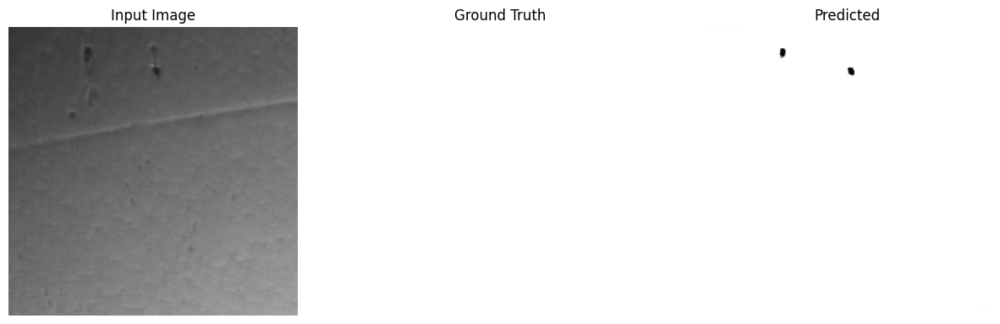

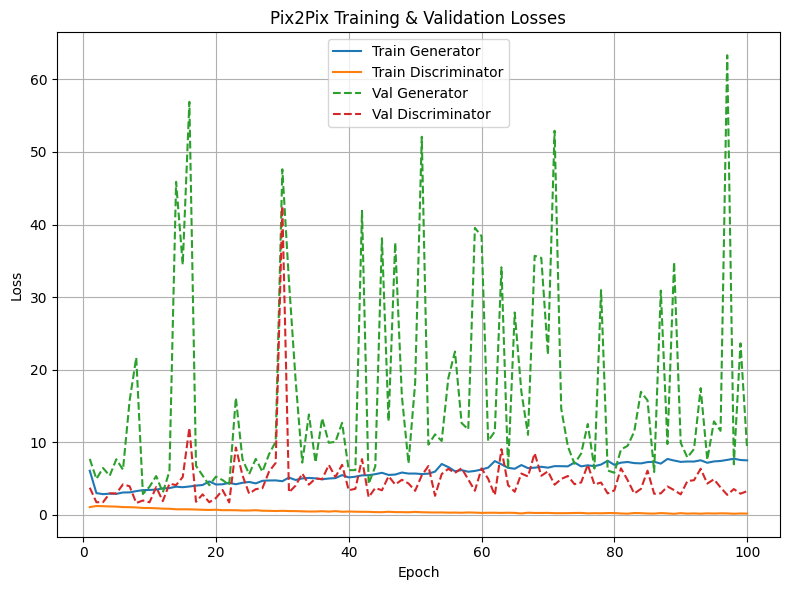

In [2]:
import os
import glob
import random
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt

# ---------------- Constants & Device ----------------
IMG_WIDTH, IMG_HEIGHT = 256, 256
BATCH_SIZE = 1
EPOCHS = 100
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --------------- Create Directories ----------------
os.makedirs("best_model", exist_ok=True)
os.makedirs("training_checkpoints", exist_ok=True)
os.makedirs("epoch_outputs", exist_ok=True)

# ------------ Loss History Containers -------------
train_g_losses, train_d_losses = [], []
val_g_losses,   val_d_losses   = [], []

# ------------------- Dataset -----------------------
class Pix2PixDataset(Dataset):
    def __init__(self, root_dir):
        self.files = glob.glob(os.path.join(root_dir, '*.jpg'))
        self.transform = transforms.Compose([
            transforms.Resize((IMG_HEIGHT, IMG_WIDTH)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        w, h = img.size
        input_image  = img.crop((0, 0, w//2, h))
        target_image = img.crop((w//2, 0, w, h))
        return self.transform(input_image), self.transform(target_image)

# ---------------- U-Net Generator -----------------
class UNetGenerator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()
        def down(in_f, out_f, norm=True):
            layers = [nn.Conv2d(in_f, out_f, 4, stride=2, padding=1)]
            if norm: layers.append(nn.BatchNorm2d(out_f))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return nn.Sequential(*layers)
        def up(in_f, out_f, dropout=False):
            layers = [
                nn.ConvTranspose2d(in_f, out_f, 4, stride=2, padding=1),
                nn.BatchNorm2d(out_f),
                nn.ReLU(inplace=True)
            ]
            if dropout: layers.append(nn.Dropout(0.5))
            return nn.Sequential(*layers)

        # encoder
        self.down1 = down(in_channels,  64, norm=False)
        self.down2 = down(64, 128)
        self.down3 = down(128,256)
        self.down4 = down(256,512)
        self.down5 = down(512,512)
        self.down6 = down(512,512)
        self.down7 = down(512,512)
        self.down8 = down(512,512, norm=False)

        # decoder
        self.up1 = up(512,512, dropout=True)
        self.up2 = up(1024,512,dropout=True)
        self.up3 = up(1024,512,dropout=True)
        self.up4 = up(1024,512)
        self.up5 = up(1024,256)
        self.up6 = up(512,128)
        self.up7 = up(256,64)

        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_channels, 4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # down
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        # up + skip
        u1 = self.up1(d8)
        u2 = self.up2(torch.cat([u1, d7],1))
        u3 = self.up3(torch.cat([u2, d6],1))
        u4 = self.up4(torch.cat([u3, d5],1))
        u5 = self.up5(torch.cat([u4, d4],1))
        u6 = self.up6(torch.cat([u5, d3],1))
        u7 = self.up7(torch.cat([u6, d2],1))
        return self.final(torch.cat([u7, d1],1))

# ------------- PatchGAN Discriminator -------------
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        def block(in_f, out_f, norm=True):
            layers = [nn.Conv2d(in_f, out_f, 4, stride=2, padding=1)]
            if norm: layers.append(nn.BatchNorm2d(out_f))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(in_channels*2, 64, norm=False),
            *block(64, 128),
            *block(128,256),
            nn.ZeroPad2d((1,0,1,0)),
            nn.Conv2d(256,1,4,padding=1)
        )

    def forward(self, inp, tar):
        x = torch.cat([inp, tar], dim=1)
        return self.model(x)

# ---------------- Loss Functions ------------------
bce_loss = nn.BCEWithLogitsLoss()
l1_loss  = nn.L1Loss()

def generator_loss(disc_generated_output, gen_output, target):
    gan = bce_loss(disc_generated_output, torch.ones_like(disc_generated_output).to(DEVICE))
    l1  = l1_loss(gen_output, target)
    return gan + 100 * l1

def discriminator_loss(disc_real, disc_fake):
    real = bce_loss(disc_real, torch.ones_like(disc_real).to(DEVICE))
    fake = bce_loss(disc_fake, torch.zeros_like(disc_fake).to(DEVICE))
    return real + fake

# --------------- Instantiate Models & Opts --------------
generator     = UNetGenerator().to(DEVICE)
discriminator = PatchDiscriminator().to(DEVICE)
g_optimizer = optim.Adam(generator.parameters(),     lr=2e-4, betas=(0.5,0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5,0.999))

# -------------- Checkpointing ---------------------
def save_checkpoint(epoch, val_gen_loss):
    torch.save({
        'epoch': epoch,
        'model_state_dict': generator.state_dict(),
        'optimizer_state_dict': g_optimizer.state_dict(),
        'val_gen_loss': val_gen_loss
    }, "best_model/pix2pix_best.pth")
    print("✅ Saved new best model")

plt.ion()

def generate_images(input_img, target, pred, epoch):
    inp = (input_img[0].permute(1,2,0).cpu().numpy() + 1) / 2
    tar = (target[0].permute(1,2,0).cpu().numpy() + 1) / 2
    out = (pred[0].permute(1,2,0).detach().cpu().numpy() + 1) / 2

    titles = ['Input Image', 'Ground Truth', 'Predicted']
    images = [inp, tar, out]

    plt.figure(figsize=(15,5))
    for i, img in enumerate(images):
        plt.subplot(1,3,i+1)
        plt.imshow(img)
        plt.title(titles[i])
        plt.axis('off')

    # always save
    plt.savefig(f"epoch_outputs/epoch_{epoch:03d}.png")
    # then show the window
    plt.show()
    # you can still close if you don't want the figure hanging around:
    plt.close()

# ----------------- Training Step ------------------
def train_step(inp, tar):
    # Generator
    generator.train()
    g_optimizer.zero_grad()
    gen_out = generator(inp)
    d_fake  = discriminator(inp, gen_out)
    g_loss  = generator_loss(d_fake, gen_out, tar)
    g_loss.backward()
    g_optimizer.step()

    # Discriminator
    discriminator.train()
    d_optimizer.zero_grad()
    d_real = discriminator(inp, tar)
    d_fake = discriminator(inp, gen_out.detach())
    d_loss = discriminator_loss(d_real, d_fake)
    d_loss.backward()
    d_optimizer.step()

    return g_loss.item(), d_loss.item()

# --------------- Validation Step -----------------
@torch.no_grad()
def validate(loader):
    generator.eval(); discriminator.eval()
    total_g, total_d = 0.0, 0.0
    for inp, tar in loader:
        inp, tar = inp.to(DEVICE), tar.to(DEVICE)
        gen_out = generator(inp)
        total_g += generator_loss(discriminator(inp, gen_out), gen_out, tar).item()
        total_d += discriminator_loss(discriminator(inp, tar), discriminator(inp, gen_out)).item()
    n = len(loader)
    return total_g/n, total_d/n

# ----------------- Fit Loop -----------------
def fit(train_loader, val_loader, epochs):
    best_val = float('inf')
    val_batches = list(val_loader)
    n_val = len(val_batches)

    for epoch in range(1, epochs+1):
        train_g, train_d = 0.0, 0.0
        for inp, tar in train_loader:
            inp, tar = inp.to(DEVICE), tar.to(DEVICE)
            g_l, d_l = train_step(inp, tar)
            train_g += g_l; train_d += d_l

        avg_g = train_g / len(train_loader)
        avg_d = train_d / len(train_loader)
        val_g, val_d = validate(val_loader)

        # record losses
        train_g_losses.append(avg_g)
        train_d_losses.append(avg_d)
        val_g_losses.append(val_g)
        val_d_losses.append(val_d)

        print(f"\nEpoch {epoch}/{epochs}")
        print(f"Train G: {avg_g:.4f}, D: {avg_d:.4f}")
        print(f" Val   G: {val_g:.4f}, D: {val_d:.4f}")

        if val_g < best_val:
            best_val = val_g
            save_checkpoint(epoch, val_g)

        # preview one validation sample
        idx = (epoch - 1) % n_val
        inp, tar = val_batches[idx]
        inp, tar = inp.to(DEVICE), tar.to(DEVICE)
        pred = generator(inp)
        generate_images(inp.cpu(), tar.cpu(), pred.cpu(), epoch)

if __name__ == "__main__":
    # prepare data
    train_ds = Pix2PixDataset("patches/train")
    val_ds   = Pix2PixDataset("patches/val")
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE)

    # train
    fit(train_loader, val_loader, EPOCHS)

    # plot losses
    epochs = range(1, EPOCHS+1)
    plt.figure(figsize=(8,6))
    plt.plot(epochs, train_g_losses, label='Train Generator')
    plt.plot(epochs, train_d_losses, label='Train Discriminator')
    plt.plot(epochs, val_g_losses,   '--', label='Val Generator')
    plt.plot(epochs, val_d_losses,   '--', label='Val Discriminator')
    plt.title('Pix2Pix Training & Validation Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('loss_curves.png')
    plt.show()


In [4]:
# Rebuild generator model (same architecture)
generator = UNetGenerator().to(DEVICE)

# Load best checkpoint
checkpoint = torch.load("best_model/pix2pix_best.pth", map_location=DEVICE)
generator.load_state_dict(checkpoint["model_state_dict"])
generator.eval()
print("Loaded trained generator from checkpoint.")


Loaded trained generator from checkpoint.


In [17]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import torchvision.transforms as transforms
import torch

class PairedImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith((".png", ".jpg", ".jpeg"))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_path).convert("RGB")
        w, h = image.size

        # Split into left (input) and right (target)
        input_img = image.crop((0, 0, w // 2, h))
        target_img = image.crop((w // 2, 0, w, h))

        if self.transform:
            input_img = self.transform(input_img)
            target_img = self.transform(target_img)

        return input_img, target_img

# Device
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Transform (match your training preprocessing)
transform = transforms.Compose([
    transforms.Resize((256, 256)),       # Resize both halves
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)) # Scale to [-1,1]
])

# Dataset and DataLoader
val_dataset = PairedImageDataset(root_dir="patches/test", transform=transform)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)


# Evaluation_Metrices

In [7]:
import os
import numpy as np
import torch
import cv2
from sklearn.metrics import precision_score, recall_score, f1_score
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

def segmentation_metrics(pred, target):
    pred_bin = (pred > 0).cpu().numpy().astype(int).flatten()
    target_bin = (target > 0).cpu().numpy().astype(int).flatten()
    intersection = (pred_bin & target_bin).sum()
    union = (pred_bin | target_bin).sum()
    iou = intersection / union if union != 0 else 0
    accuracy = (pred_bin == target_bin).mean()
    precision = precision_score(target_bin, pred_bin, zero_division=0)
    recall = recall_score(target_bin, pred_bin, zero_division=0)
    f1 = f1_score(target_bin, pred_bin, zero_division=0)
    return iou, accuracy, precision, recall, f1

def count_colonies(mask):
    binary_mask = (mask > 0).cpu().numpy().astype(np.uint8)[0, 0]
    count, _ = cv2.connectedComponents(binary_mask)
    return count - 1

def compute_wer(true_count, pred_count):
    return abs(true_count - pred_count) / max(true_count, 1)

def visualize_comparison(input_img, ground_truth, prediction, save_path):
    inp = (input_img[0].permute(1,2,0).cpu().numpy() + 1) / 2
    tar = (ground_truth[0].permute(1,2,0).cpu().numpy() + 1) / 2
    out = (prediction[0].permute(1,2,0).detach().cpu().numpy() + 1) / 2
    titles = ['Input', 'Ground Truth', 'Predicted']
    images = [inp, tar, out]
    plt.figure(figsize=(15,5))
    for i, img in enumerate(images):
        plt.subplot(1,3,i+1)
        plt.imshow(img)
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Load trained model
generator = UNetGenerator().to(DEVICE)
checkpoint = torch.load("best_model/pix2pix_best.pth", map_location=DEVICE)
generator.load_state_dict(checkpoint["model_state_dict"])
generator.eval()

# Run evaluation
output_dir = "evaluation_outputs"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(f"{output_dir}/error_cases", exist_ok=True)

ious, accs, precisions, recalls, f1s, wers = [], [], [], [], [], []
manual_counts, auto_counts = [], []

for i, (inp, tar) in enumerate(val_loader):
    inp, tar = inp.to(DEVICE), tar.to(DEVICE)
    pred = generator(inp)
    pred_bin = (pred > 0)

    iou, acc, prec, rec, f1 = segmentation_metrics(pred, tar)
    pred_count = count_colonies(pred_bin)
    true_count = count_colonies(tar)
    wer = compute_wer(true_count, pred_count)

    ious.append(iou); accs.append(acc); precisions.append(prec)
    recalls.append(rec); f1s.append(f1); wers.append(wer)
    manual_counts.append(true_count); auto_counts.append(pred_count)

    vis_path = f"{output_dir}/sample_{i:03d}.png"
    visualize_comparison(inp.cpu(), tar.cpu(), pred.cpu(), vis_path)

    if iou < 0.5 or wer > 0.25:
        os.rename(vis_path, f"{output_dir}/error_cases/error_{i:03d}.png")

# Summary
corr, _ = pearsonr(manual_counts, auto_counts)
avg_diff = np.mean([abs(m - a) for m, a in zip(manual_counts, auto_counts)])
summary = {
    "IoU": np.mean(ious),
    "Accuracy": np.mean(accs),
    "Precision": np.mean(precisions),
    "Recall": np.mean(recalls),
    "F1-score": np.mean(f1s),
    "Avg Count Difference": avg_diff,
}
print("Evaluation Summary:")
for k,v in summary.items():
    print(f"{k}: {v:.4f}")


Evaluation Summary:
IoU: 0.9896
Accuracy: 0.9899
Precision: 0.9944
Recall: 0.9952
F1-score: 0.9947
Avg Count Difference: 1.3528


In [2]:
import torch
from torchvision.transforms import ToTensor, Normalize, Compose
from torchvision.transforms.functional import to_pil_image
from PIL import Image
import math

# Constants
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMG_PATH = "Test_Dataset/2.tiff"
SAVE_PATH = "output_generated_padded_cropped.png"
PATCH_SIZE = 256

# Load model
class UNetGenerator(torch.nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()
        def down(in_f, out_f, norm=True):
            layers = [torch.nn.Conv2d(in_f, out_f, 4, 2, 1)]
            if norm: layers.append(torch.nn.BatchNorm2d(out_f))
            layers.append(torch.nn.LeakyReLU(0.2, inplace=True))
            return torch.nn.Sequential(*layers)
        def up(in_f, out_f, dropout=False):
            layers = [torch.nn.ConvTranspose2d(in_f, out_f, 4, 2, 1),
                      torch.nn.BatchNorm2d(out_f),
                      torch.nn.ReLU(inplace=True)]
            if dropout: layers.append(torch.nn.Dropout(0.5))
            return torch.nn.Sequential(*layers)
        self.down1 = down(in_channels,  64, norm=False)
        self.down2 = down(64, 128)
        self.down3 = down(128,256)
        self.down4 = down(256,512)
        self.down5 = down(512,512)
        self.down6 = down(512,512)
        self.down7 = down(512,512)
        self.down8 = down(512,512, norm=False)
        self.up1 = up(512,512, dropout=True)
        self.up2 = up(1024,512,dropout=True)
        self.up3 = up(1024,512,dropout=True)
        self.up4 = up(1024,512)
        self.up5 = up(1024,256)
        self.up6 = up(512,128)
        self.up7 = up(256,64)
        self.final = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(128, out_channels, 4, 2, 1),
            torch.nn.Tanh()
        )
    def forward(self, x):
        d1 = self.down1(x); d2 = self.down2(d1); d3 = self.down3(d2)
        d4 = self.down4(d3); d5 = self.down5(d4); d6 = self.down6(d5)
        d7 = self.down7(d6); d8 = self.down8(d7)
        u1 = self.up1(d8); u2 = self.up2(torch.cat([u1,d7],1))
        u3 = self.up3(torch.cat([u2,d6],1)); u4 = self.up4(torch.cat([u3,d5],1))
        u5 = self.up5(torch.cat([u4,d4],1)); u6 = self.up6(torch.cat([u5,d3],1))
        u7 = self.up7(torch.cat([u6,d2],1)); return self.final(torch.cat([u7,d1],1))

# Load generator weights
generator = UNetGenerator().to(DEVICE)
checkpoint = torch.load("best_model/pix2pix_best.pth", map_location=DEVICE)
generator.load_state_dict(checkpoint["model_state_dict"])
generator.eval()

# Transform
transform = Compose([
    ToTensor(),
    Normalize([0.5]*3, [0.5]*3)
])

# Load and pad image
img = Image.open(IMG_PATH).convert("RGB")
orig_w, orig_h = img.size
pad_w = math.ceil(orig_w / PATCH_SIZE) * PATCH_SIZE
pad_h = math.ceil(orig_h / PATCH_SIZE) * PATCH_SIZE
padded_img = Image.new("RGB", (pad_w, pad_h))
padded_img.paste(img, (0, 0))

# Predict in patches
output_img = Image.new("RGB", (pad_w, pad_h))
for i in range(0, pad_w, PATCH_SIZE):
    for j in range(0, pad_h, PATCH_SIZE):
        patch = padded_img.crop((i, j, i+PATCH_SIZE, j+PATCH_SIZE))
        input_tensor = transform(patch).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            output_tensor = generator(input_tensor)[0].cpu()
            output_tensor = (output_tensor + 1) / 2
            output_patch = to_pil_image(output_tensor)
        output_img.paste(output_patch, (i, j))

# Crop to original size and save
final_output = output_img.crop((0, 0, orig_w, orig_h))
final_output.save(SAVE_PATH)
final_output.show()
print(f"✅ Output saved to: {SAVE_PATH} (original size: {orig_w}x{orig_h})")


✅ Output saved to: output_generated_padded_cropped.png (original size: 1392x1040)
